###group project:###
Interpolation and in-painting for sparse neuroimaging data


*   5 methods:linear,Polynomial,Spline,Exponential,kriginig
*   5 frequency bands
*   evaluation strand:MSE,MAE,RMSE,R²

goal: interlopation using polynomail method

dataset:

*   coords.npy : <class 'numpy.ndarray'> stores EEG band power data in (1772, 3) format, where N is the number of measurement points, each with three spectral power values.
*   band_powers.npy : <class 'dict'> contains 3D coordinates (x, y, z) of measurement points in (1772, 3) format, used for spatial interpolation analysis







dataset visualization

In [1]:
import numpy as np
import matplotlib.pyplot as plt
samples = np.load('coords.npy')
band_powers = np.load('band_powers.npy', allow_pickle=True).item()
print(type(samples))
print(type(band_powers))  # print the type of the dataset
print(band_powers.keys()) # print the band power

<class 'numpy.ndarray'>
<class 'dict'>
dict_keys(['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma'])


In [2]:
import numpy as np

# read the data
samples = np.load('coords.npy')
band_powers = np.load('band_powers.npy', allow_pickle=True).item()

# check the data structure
print(f"Electrode coordinate data shape: {samples.shape}")
print(f"First 10 lines of electrode coordinate data: \n{samples[:10]}")
print(f"Available frequency band: {band_powers.keys()}")

# choose Delta as example
delta_powers = np.array(band_powers['Delta'])
print(delta_powers.shape)

print(f"Delta Frequency band power data shape: {delta_powers.shape}")
print(f"Delta Top 10 values of frequency band power: {delta_powers[:5]}")


Electrode coordinate data shape: (1772, 3)
First 10 lines of electrode coordinate data: 
[[-56. -37.  -2.]
 [-60. -37.  -4.]
 [-63. -37.  -2.]
 [-68. -38.  -2.]
 [ -1.  42. -14.]
 [ -4.  42. -14.]
 [ -8.  42. -13.]
 [-12.  43. -13.]
 [-34. -33.   8.]
 [-38. -33.  10.]]
Available frequency band: dict_keys(['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma'])
(1772,)
Delta Frequency band power data shape: (1772,)
Delta Top 10 values of frequency band power: [0.10527825 0.12613966 0.11567981 0.13830112 0.15696394]


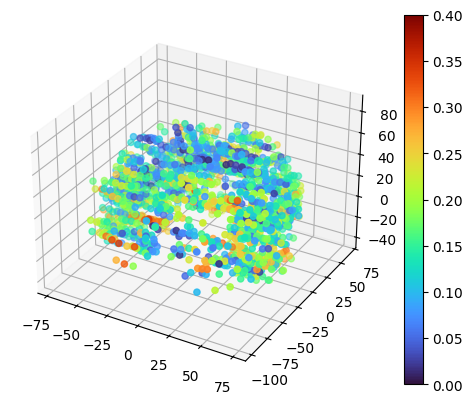

In [3]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(samples[:,0], samples[:,1], samples[:,2],
                c=band_powers['Delta'], cmap='turbo', vmin=0, vmax=0.4) #3D visualization
plt.colorbar(sc)
plt.show()

/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:1363: RuntimeWarning: divide by zero encountered in divide
  return poly1d(self.coeffs/other)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:833: RuntimeWarning: invalid value encountered in add
  val = a1 + a2


Evaluation Metrics for Lagrange Interpolation:
MSE  : 0.0312
MAE  : 0.1561
RMSE : 0.1765
R²   : -3.5954


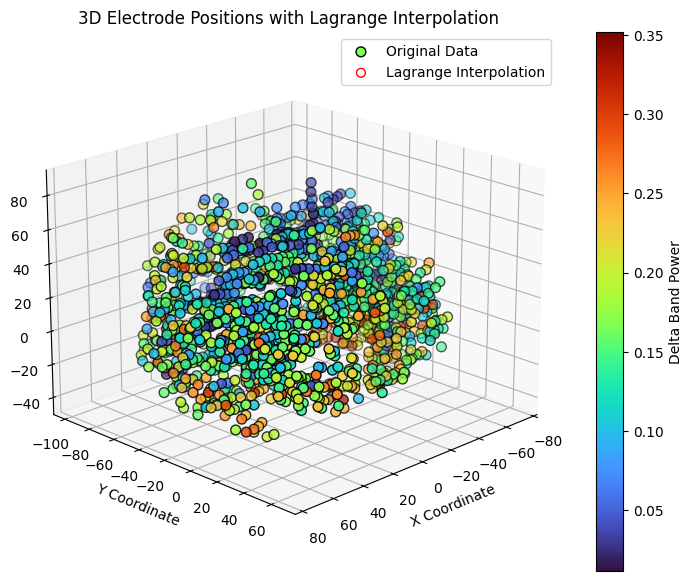

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import lagrange
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Load dataset
samples = np.load('coords.npy')  # 3D electrode coordinates
band_powers = np.load('band_powers.npy', allow_pickle=True).item()  # Frequency band power data

# Convert to NumPy arrays to avoid indexing issues
X = np.array(samples[:, 0])
Y = np.array(samples[:, 1])
Z = np.array(samples[:, 2])
delta_powers = np.array(band_powers['Delta'])  # Ensure it's a NumPy array

# Sort X to avoid interpolation errors
sort_idx = np.argsort(X)
X = X[sort_idx]
Y = Y[sort_idx]
Z = Z[sort_idx]
delta_powers = delta_powers[sort_idx]

# Limit the interpolation to a subset to prevent overflow
subset_size = min(20, len(X))  # Limit to 20 points
X_subset = X[:subset_size]
Y_subset = Y[:subset_size]
Z_subset = Z[:subset_size]
Delta_subset = delta_powers[:subset_size]

# Generate interpolation points within the X range
num_points = 50
X_interp = np.linspace(np.min(X_subset), np.max(X_subset), num_points)

# Perform Lagrange interpolation
lagrange_y = lagrange(X_subset, Y_subset)
lagrange_z = lagrange(X_subset, Z_subset)
lagrange_delta = lagrange(X_subset, Delta_subset)

Y_interp = lagrange_y(X_interp)
Z_interp = lagrange_z(X_interp)
Delta_interp = lagrange_delta(X_interp)

# Handle invalid values
if np.any(np.isnan(Delta_interp)) or np.any(np.isinf(Delta_interp)):
    print("Warning: Lagrange interpolation generated invalid values!")
    Delta_interp = np.nan_to_num(Delta_interp)  # Replace NaN/inf with 0

# Find nearest real data points for evaluation
indices = np.searchsorted(X, X_interp)
indices = np.clip(indices, 0, len(X) - 1)

# Compute evaluation metrics
mse = mean_squared_error(delta_powers[indices], Delta_interp)
mae = mean_absolute_error(delta_powers[indices], Delta_interp)
rmse = np.sqrt(mse)
r2 = r2_score(delta_powers[indices], Delta_interp)

# Print evaluation metrics
print(f"Evaluation Metrics for Lagrange Interpolation:")
print(f"MSE  : {mse:.4f}")
print(f"MAE  : {mae:.4f}")
print(f"RMSE : {rmse:.4f}")
print(f"R²   : {r2:.4f}")

# Plot 3D interpolation result
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Original data points
sc = ax.scatter(X, Y, Z, c=delta_powers, cmap='turbo', label="Original Data", s=50, edgecolor='k')

# Interpolated data points
sc_interp = ax.scatter(X_interp, Y_interp, Z_interp, c=Delta_interp, cmap='coolwarm', label="Lagrange Interpolation", s=40, edgecolor='r')

# Color bar
cbar = plt.colorbar(sc)
cbar.set_label('Delta Band Power')

# Axis labels
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Z Coordinate')
ax.set_title('3D Electrode Positions with Lagrange Interpolation')

# Show legend
ax.legend()

# Adjust view angle
ax.view_init(elev=20, azim=45)

plt.show()



=== Fold 1 ===
MSE  : 0.0403
MAE  : 0.2007
RMSE : 0.2007
R²   : 0.0000


/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:1363: RuntimeWarning: divide by zero encountered in divide
  return poly1d(self.coeffs/other)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:833: RuntimeWarning: invalid value encountered in add
  val = a1 + a2


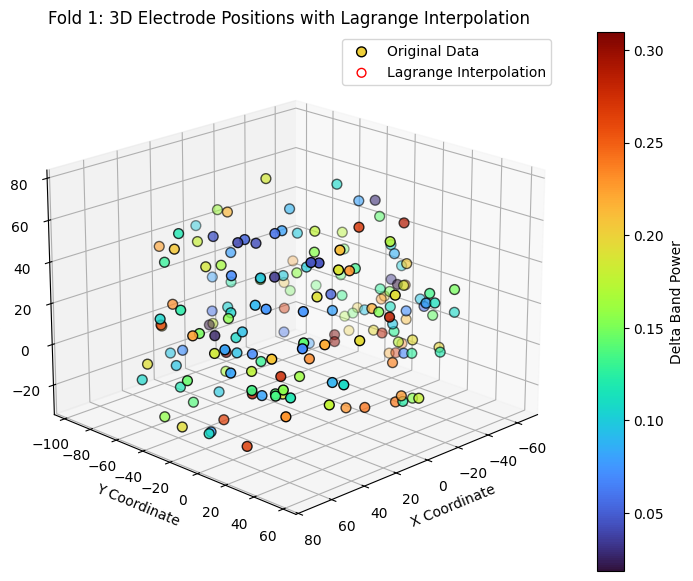


=== Fold 2 ===
MSE  : 0.0126
MAE  : 0.0976
RMSE : 0.1122
R²   : -3.1061


/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:1363: RuntimeWarning: divide by zero encountered in divide
  return poly1d(self.coeffs/other)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:833: RuntimeWarning: invalid value encountered in add
  val = a1 + a2


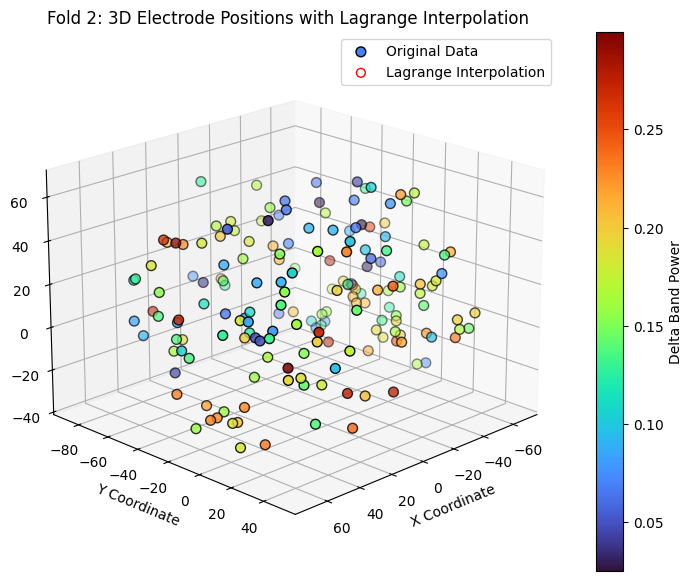


=== Fold 3 ===
MSE  : 0.0272
MAE  : 0.1650
RMSE : 0.1650
R²   : 0.0000


/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:1363: RuntimeWarning: divide by zero encountered in divide
  return poly1d(self.coeffs/other)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:833: RuntimeWarning: invalid value encountered in add
  val = a1 + a2


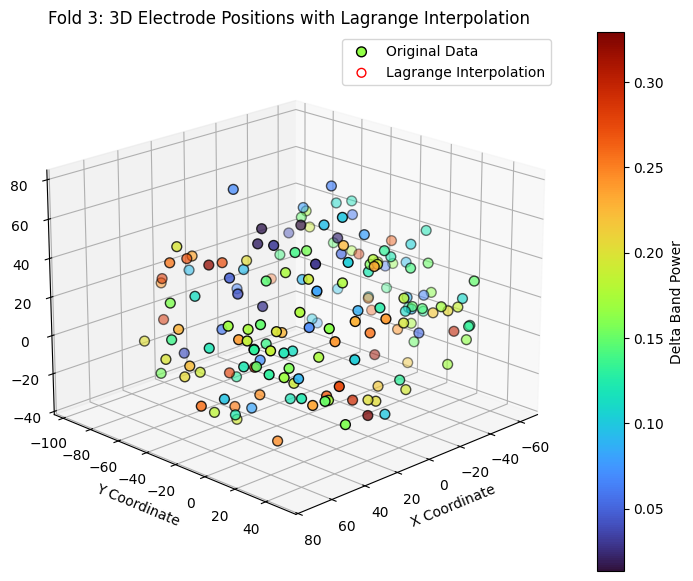


=== Fold 4 ===
MSE  : 0.0098
MAE  : 0.0825
RMSE : 0.0991
R²   : -2.2707


/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:1363: RuntimeWarning: divide by zero encountered in divide
  return poly1d(self.coeffs/other)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:833: RuntimeWarning: invalid value encountered in add
  val = a1 + a2


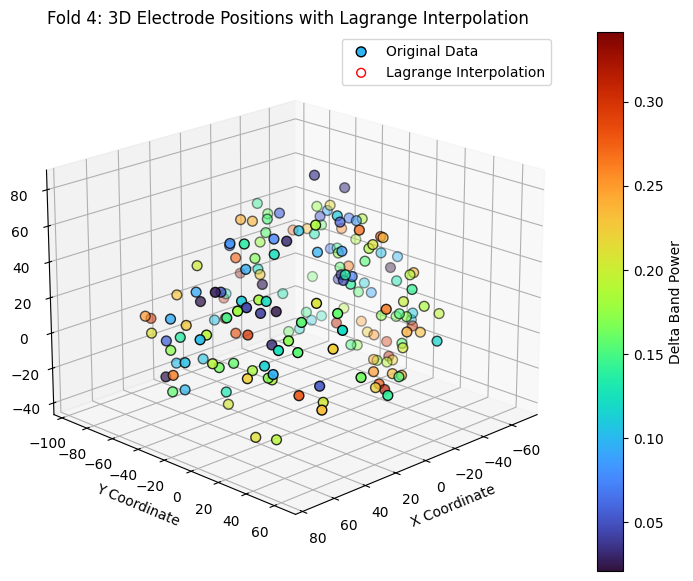


=== Fold 5 ===
MSE  : 0.0284
MAE  : 0.1662
RMSE : 0.1685
R²   : -35.2186


/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:1363: RuntimeWarning: divide by zero encountered in divide
  return poly1d(self.coeffs/other)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:833: RuntimeWarning: invalid value encountered in add
  val = a1 + a2
/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:769: RuntimeWarning: invalid value encountered in add
  y = y * x + pv


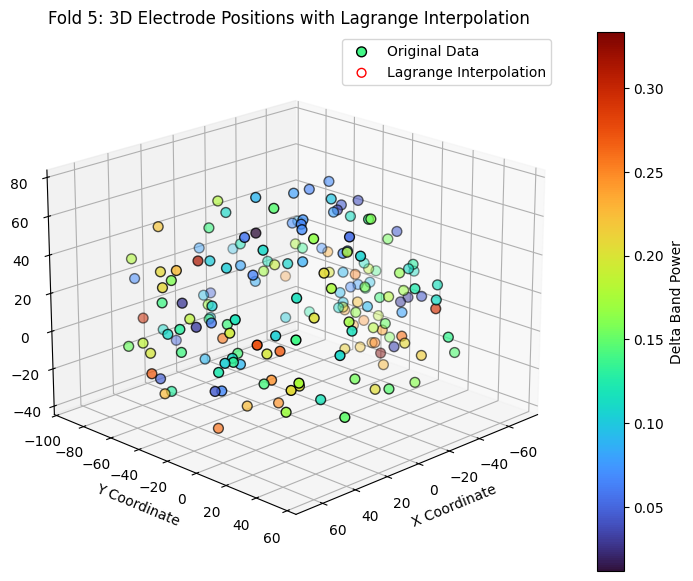


=== Fold 6 ===
MSE  : 0.0418
MAE  : 0.2035
RMSE : 0.2044
R²   : -115.3557


/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:1363: RuntimeWarning: divide by zero encountered in divide
  return poly1d(self.coeffs/other)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:833: RuntimeWarning: invalid value encountered in add
  val = a1 + a2


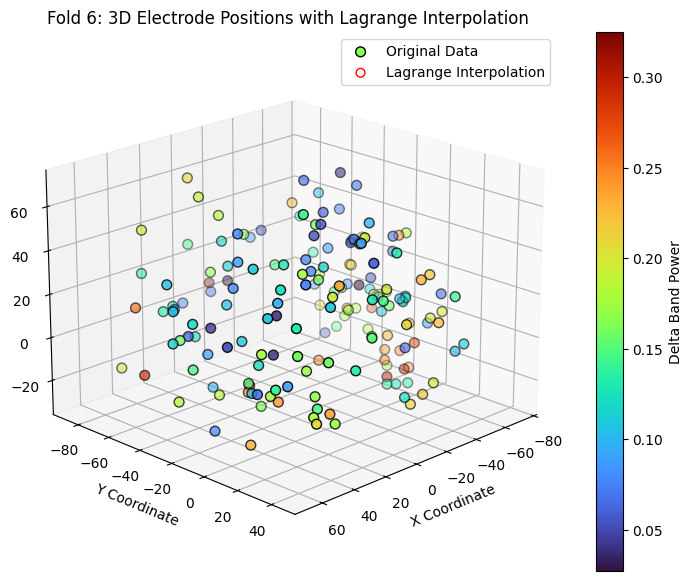


=== Fold 7 ===
MSE  : 0.0111
MAE  : 0.1054
RMSE : 0.1054
R²   : -646.1301


/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:1363: RuntimeWarning: divide by zero encountered in divide
  return poly1d(self.coeffs/other)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:833: RuntimeWarning: invalid value encountered in add
  val = a1 + a2


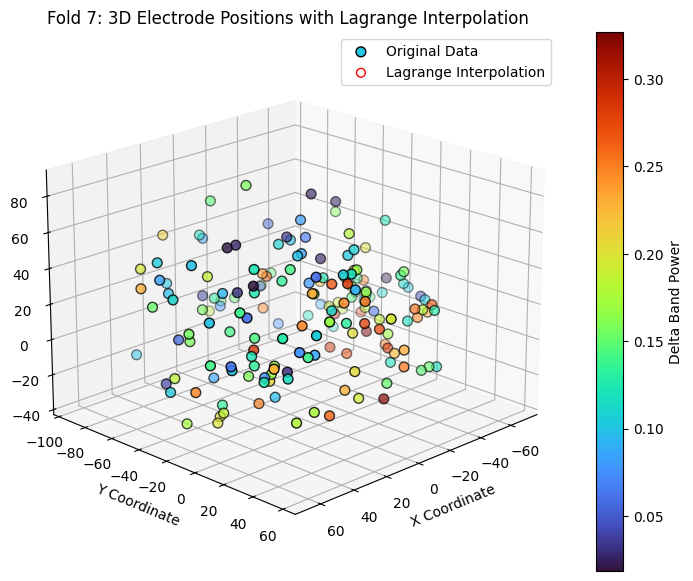


=== Fold 8 ===
MSE  : 0.0165
MAE  : 0.1222
RMSE : 0.1284
R²   : -9.5430


/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:1363: RuntimeWarning: divide by zero encountered in divide
  return poly1d(self.coeffs/other)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:833: RuntimeWarning: invalid value encountered in add
  val = a1 + a2


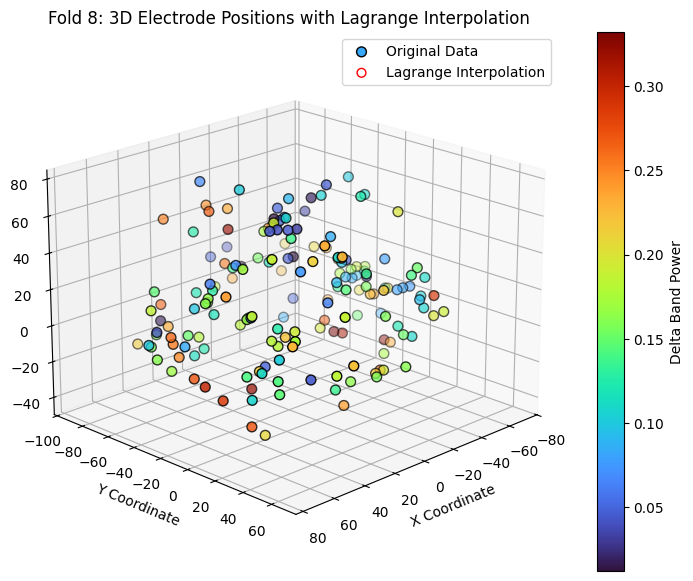


=== Fold 9 ===
MSE  : 0.0503
MAE  : 0.2216
RMSE : 0.2242
R²   : -41.8613


/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:1363: RuntimeWarning: divide by zero encountered in divide
  return poly1d(self.coeffs/other)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:833: RuntimeWarning: invalid value encountered in add
  val = a1 + a2


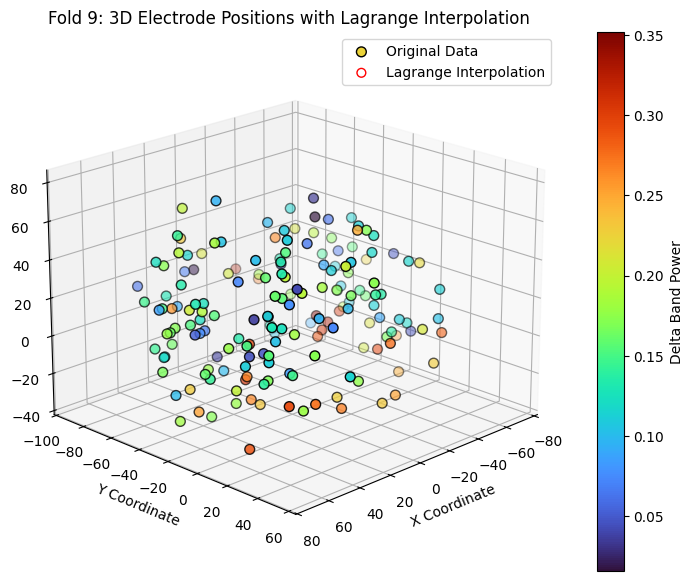


=== Fold 10 ===
MSE  : 0.0143
MAE  : 0.1078
RMSE : 0.1197
R²   : -4.3045


/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:1363: RuntimeWarning: divide by zero encountered in divide
  return poly1d(self.coeffs/other)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:833: RuntimeWarning: invalid value encountered in add
  val = a1 + a2


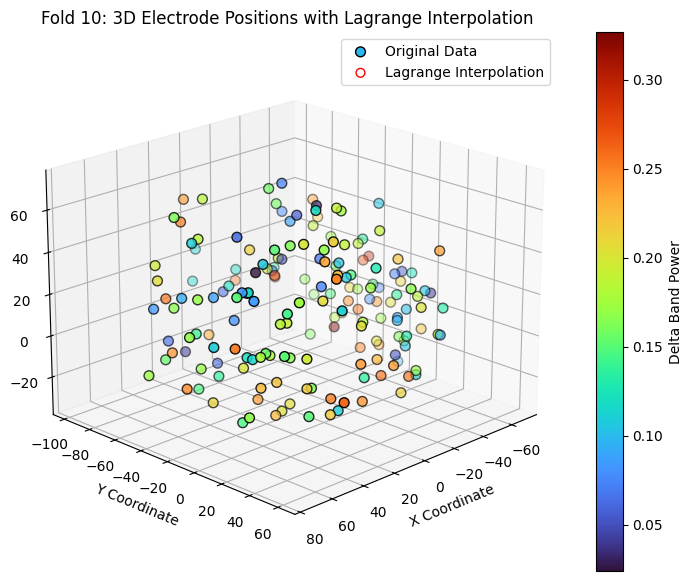


=== Final Evaluation Across 10 Folds ===
Mean MSE  : 0.0252 ± 0.0139
Mean MAE  : 0.1472 ± 0.0478
Mean RMSE : 0.1528 ± 0.0435
Mean R²   : -85.7790 ± 189.8230

T-test between MSE and MAE across folds:
T-statistic: -10.7324, P-value: 0.0000
Significant difference found (p < 0.05), suggesting MSE and MAE distributions are different.


In [13]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import lagrange
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from scipy.stats import ttest_rel  # T-test for paired samples

# Load dataset
samples = np.load('coords.npy')  # 3D electrode coordinates
band_powers = np.load('band_powers.npy', allow_pickle=True).item()  # Frequency band power data

# Convert to NumPy arrays to avoid indexing issues
X = np.array(samples[:, 0])
Y = np.array(samples[:, 1])
Z = np.array(samples[:, 2])
delta_powers = np.array(band_powers['Delta'])  # Ensure it's a NumPy array

# Sort X to avoid interpolation errors
sort_idx = np.argsort(X)
X = X[sort_idx]
Y = Y[sort_idx]
Z = Z[sort_idx]
delta_powers = delta_powers[sort_idx]

# Define KFold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Store evaluation metrics
mse_scores = []
mae_scores = []
rmse_scores = []
r2_scores = []

# Perform 10-fold cross-validation
fold = 1
for train_index, test_index in kf.split(X):
    print(f"\n=== Fold {fold} ===")

    # Split data into training and testing sets
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]
    Z_train, Z_test = Z[train_index], Z[test_index]
    Delta_train, Delta_test = delta_powers[train_index], delta_powers[test_index]

    # Limit the interpolation to a subset to prevent overflow
    subset_size = min(20, len(X_train))  # Limit to 20 points
    X_subset = X_train[:subset_size]
    Y_subset = Y_train[:subset_size]
    Z_subset = Z_train[:subset_size]
    Delta_subset = Delta_train[:subset_size]

    # Generate interpolation points within the X range
    num_points = 50
    X_interp = np.linspace(np.min(X_subset), np.max(X_subset), num_points)

    # Perform Lagrange interpolation
    lagrange_y = lagrange(X_subset, Y_subset)
    lagrange_z = lagrange(X_subset, Z_subset)
    lagrange_delta = lagrange(X_subset, Delta_subset)

    Y_interp = lagrange_y(X_interp)
    Z_interp = lagrange_z(X_interp)
    Delta_interp = lagrange_delta(X_interp)

    # Handle invalid values
    if np.any(np.isnan(Delta_interp)) or np.any(np.isinf(Delta_interp)):
        print("Warning: Lagrange interpolation generated invalid values!")
        Delta_interp = np.nan_to_num(Delta_interp)  # Replace NaN/inf with 0

    # Find nearest real data points for evaluation
    indices = np.searchsorted(X_test, X_interp)
    indices = np.clip(indices, 0, len(X_test) - 1)

    # Compute evaluation metrics
    mse = mean_squared_error(Delta_test[indices], Delta_interp)
    mae = mean_absolute_error(Delta_test[indices], Delta_interp)
    rmse = np.sqrt(mse)
    r2 = r2_score(Delta_test[indices], Delta_interp)

    # Store scores
    mse_scores.append(mse)
    mae_scores.append(mae)
    rmse_scores.append(rmse)
    r2_scores.append(r2)

    # Print evaluation metrics
    print(f"MSE  : {mse:.4f}")
    print(f"MAE  : {mae:.4f}")
    print(f"RMSE : {rmse:.4f}")
    print(f"R²   : {r2:.4f}")

    # Plot 3D interpolation result
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Original test data points
    sc = ax.scatter(X_test, Y_test, Z_test, c=Delta_test, cmap='turbo', label="Original Data", s=50, edgecolor='k')

    # Interpolated test data points
    sc_interp = ax.scatter(X_interp, Y_interp, Z_interp, c=Delta_interp, cmap='coolwarm', label="Lagrange Interpolation", s=40, edgecolor='r')

    # Color bar
    cbar = plt.colorbar(sc)
    cbar.set_label('Delta Band Power')

    # Axis labels
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.set_zlabel('Z Coordinate')
    ax.set_title(f'Fold {fold}: 3D Electrode Positions with Lagrange Interpolation')

    # Show legend
    ax.legend()

    # Adjust view angle
    ax.view_init(elev=20, azim=45)

    # Show the plot
    plt.show()

    fold += 1

# Perform t-test to compare MSE scores across folds
t_stat, p_value = ttest_rel(mse_scores, mae_scores)  # Using paired test

# Print final evaluation
print("\n=== Final Evaluation Across 10 Folds ===")
print(f"Mean MSE  : {np.mean(mse_scores):.4f} ± {np.std(mse_scores):.4f}")
print(f"Mean MAE  : {np.mean(mae_scores):.4f} ± {np.std(mae_scores):.4f}")
print(f"Mean RMSE : {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")
print(f"Mean R²   : {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")

# Print t-test results
print(f"\nT-test between MSE and MAE across folds:")
print(f"T-statistic: {t_stat:.4f}, P-value: {p_value:.4f}")

# Interpretation of t-test
if p_value < 0.05:
    print("Significant difference found (p < 0.05), suggesting MSE and MAE distributions are different.")
else:
    print("No significant difference found (p >= 0.05), suggesting MSE and MAE distributions are similar.")


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import KroghInterpolator  # Newton interpolation
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from scipy.stats import ttest_rel  # T-test for paired samples

# Load dataset
samples = np.load('coords.npy')  # 3D electrode coordinates
band_powers = np.load('band_powers.npy', allow_pickle=True).item()  # Frequency band power data

# Convert to NumPy arrays to avoid indexing issues
X = np.array(samples[:, 0])
Y = np.array(samples[:, 1])
Z = np.array(samples[:, 2])
delta_powers = np.array(band_powers['Delta'])  # Ensure it's a NumPy array

# Define KFold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Function to compute evaluation metrics
def compute_metrics(true_values, predicted_values):
    """Compute evaluation metrics: MSE, MAE, RMSE, R²."""
    mse = mean_squared_error(true_values, predicted_values)
    mae = mean_absolute_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    r2 = r2_score(true_values, predicted_values)
    return mse, mae, rmse, r2

# Store evaluation metrics
mse_scores = []
mae_scores = []
rmse_scores = []
r2_scores = []

# Perform 10-fold cross-validation
fold = 1
for train_index, test_index in kf.split(X):
    print(f"\n=== Fold {fold} ===")

    # Split data into training and testing sets
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]
    Z_train, Z_test = Z[train_index], Z[test_index]
    Delta_train, Delta_test = delta_powers[train_index], delta_powers[test_index]

    # Limit the interpolation to a subset to prevent overflow
    subset_size = min(20, len(X_train))  # Use only 20 data points for interpolation
    X_train_subset = X_train[:subset_size]
    Y_train_subset = Y_train[:subset_size]
    Z_train_subset = Z_train[:subset_size]
    Delta_train_subset = Delta_train[:subset_size]

    # Remove duplicate X values
    unique_indices = np.unique(X_train_subset, return_index=True)[1]
    X_train_subset = X_train_subset[unique_indices]
    Y_train_subset = Y_train_subset[unique_indices]
    Z_train_subset = Z_train_subset[unique_indices]
    Delta_train_subset = Delta_train_subset[unique_indices]

    # If after removing duplicates we only have 1 point, use a simple constant function
    if len(X_train_subset) < 2:
        print(f"Warning: Only one unique X value in Fold {fold}, switching to constant interpolation.")
        interp_y = lambda x: np.full_like(x, Y_train_subset[0])
        interp_z = lambda x: np.full_like(x, Z_train_subset[0])
        interp_delta = lambda x: np.full_like(x, Delta_train_subset[0])
    else:
        interp_y = KroghInterpolator(X_train_subset, Y_train_subset)
        interp_z = KroghInterpolator(X_train_subset, Z_train_subset)
        interp_delta = KroghInterpolator(X_train_subset, Delta_train_subset)

    # Interpolate values for test X positions
    Y_interp = interp_y(X_test)
    Z_interp = interp_z(X_test)
    Delta_interp = interp_delta(X_test)

    # Compute metrics for this fold
    mse, mae, rmse, r2 = compute_metrics(Delta_test, Delta_interp)

    # Store scores
    mse_scores.append(mse)
    mae_scores.append(mae)
    rmse_scores.append(rmse)
    r2_scores.append(r2)

    # Print evaluation metrics
    print(f"MSE  : {mse:.4f}")
    print(f"MAE  : {mae:.4f}")
    print(f"RMSE : {rmse:.4f}")
    print(f"R²   : {r2:.4f}")

    fold += 1

# Perform t-test to compare MSE and MAE scores across folds
t_stat, p_value = ttest_rel(mse_scores, mae_scores)  # Using paired t-test

# Print final evaluation
print("\n=== Final Evaluation Across 10 Folds ===")
print(f"Mean MSE  : {np.mean(mse_scores):.4f} ± {np.std(mse_scores):.4f}")
print(f"Mean MAE  : {np.mean(mae_scores):.4f} ± {np.std(mae_scores):.4f}")
print(f"Mean RMSE : {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")
print(f"Mean R²   : {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")

# Print t-test results
print(f"\nT-test between MSE and MAE across folds:")
print(f"T-statistic: {t_stat:.4f}, P-value: {p_value:.4f}")

# Interpretation of t-test
if p_value < 0.05:
    print("Significant difference found (p < 0.05), suggesting MSE and MAE distributions are different.")
else:
    print("No significant difference found (p >= 0.05), suggesting MSE and MAE distributions are similar.")



=== Fold 1 ===
MSE  : 514770262950.6315
MAE  : 92612.0630
RMSE : 717474.9215
R²   : -109937088577563.1406

=== Fold 2 ===
MSE  : 55867038705870.2109
MAE  : 798440.0301
RMSE : 7474425.6439
R²   : -10492526581408680.0000

=== Fold 3 ===
MSE  : 65655230633.2144
MAE  : 58060.7788
RMSE : 256232.7665
R²   : -12350342091511.0078

=== Fold 4 ===
MSE  : 27577705091683.4062
MAE  : 905637.7488
RMSE : 5251447.9043
R²   : -6554784310297152.0000

=== Fold 5 ===
MSE  : 37470848.5672
MAE  : 889.9757
RMSE : 6121.3437
R²   : -7920087982.6509

=== Fold 6 ===
MSE  : 1597274.7912
MAE  : 138.7305
RMSE : 1263.8334
R²   : -327002511.6272

=== Fold 7 ===
MSE  : 113911293991.1391
MAE  : 47616.9658
RMSE : 337507.4725
R²   : -22418387976358.0352

=== Fold 8 ===
MSE  : 4338888980286.7529
MAE  : 406647.2297
RMSE : 2082999.9953
R²   : -847666048166684.7500

=== Fold 9 ===
MSE  : 6208699598399.1406
MAE  : 390361.5864
RMSE : 2491726.2286
R²   : -1572451789347635.7500

=== Fold 10 ===
MSE  : 50432564698.9312
MAE  : 30


=== Fold 1 ===
MSE  : 0.0046
MAE  : 0.0566
RMSE : 0.0680
R²   : 0.0113


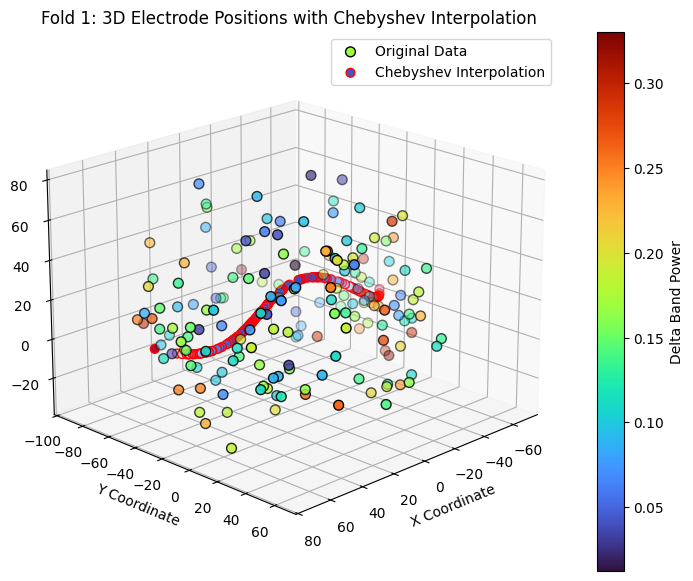


=== Fold 2 ===
MSE  : 0.0053
MAE  : 0.0594
RMSE : 0.0730
R²   : -0.0000


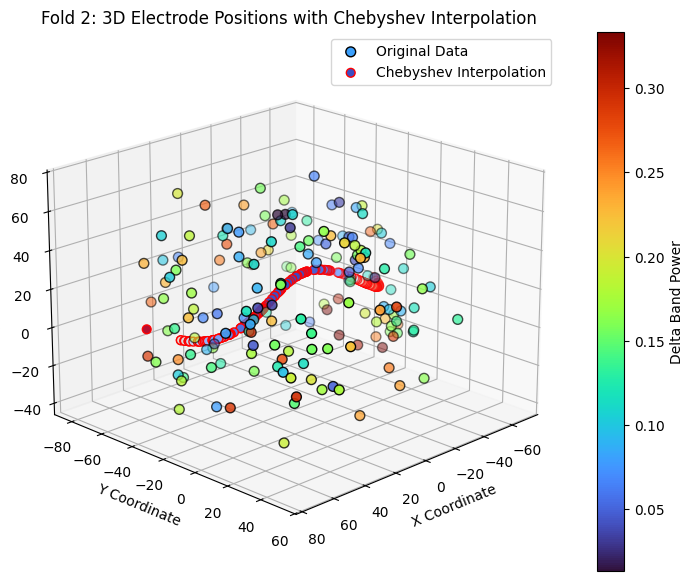


=== Fold 3 ===
MSE  : 0.0053
MAE  : 0.0607
RMSE : 0.0731
R²   : -0.0053


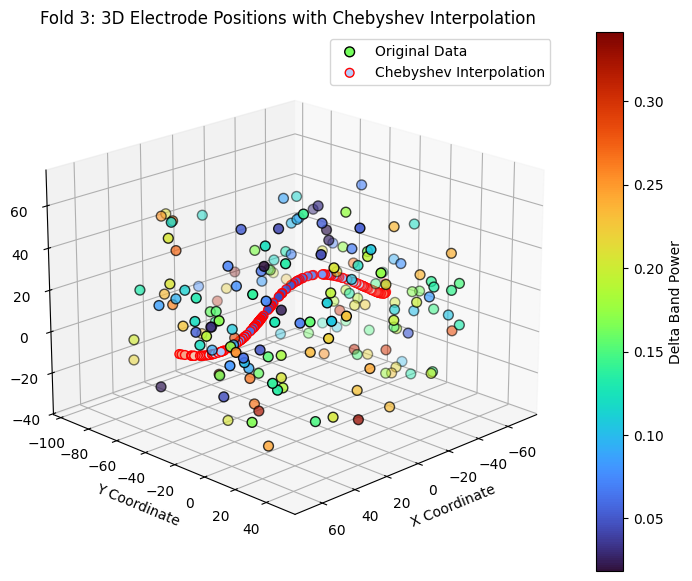


=== Fold 4 ===
MSE  : 0.0042
MAE  : 0.0530
RMSE : 0.0646
R²   : 0.0068


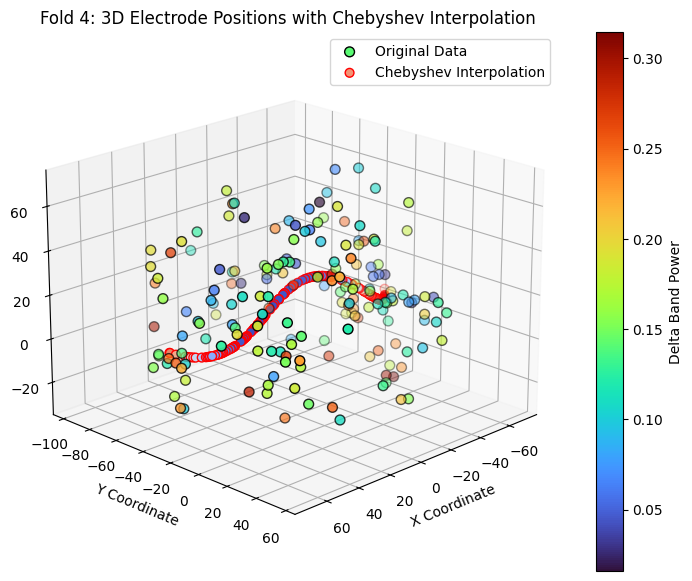


=== Fold 5 ===
MSE  : 0.0048
MAE  : 0.0559
RMSE : 0.0692
R²   : -0.0107


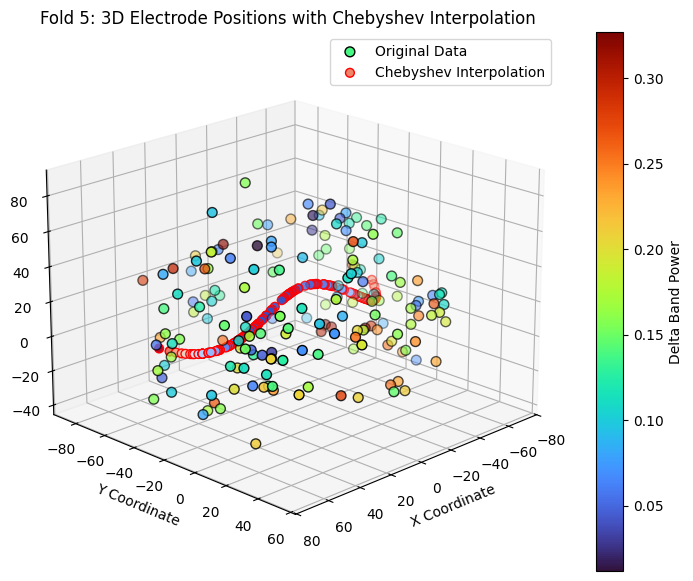


=== Fold 6 ===
MSE  : 0.0049
MAE  : 0.0580
RMSE : 0.0699
R²   : 0.0006


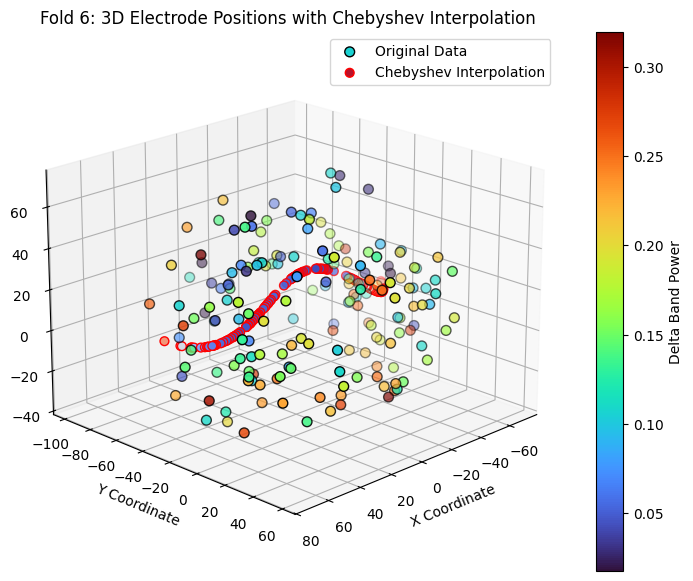


=== Fold 7 ===
MSE  : 0.0051
MAE  : 0.0592
RMSE : 0.0717
R²   : -0.0131


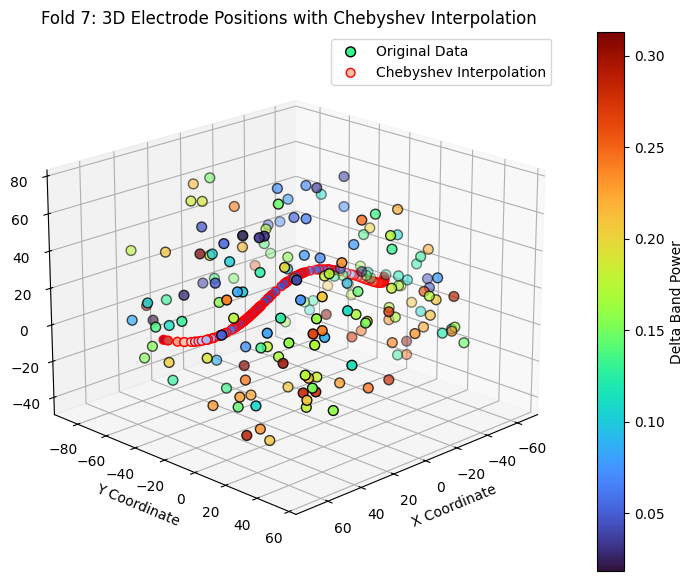


=== Fold 8 ===
MSE  : 0.0051
MAE  : 0.0583
RMSE : 0.0712
R²   : 0.0103


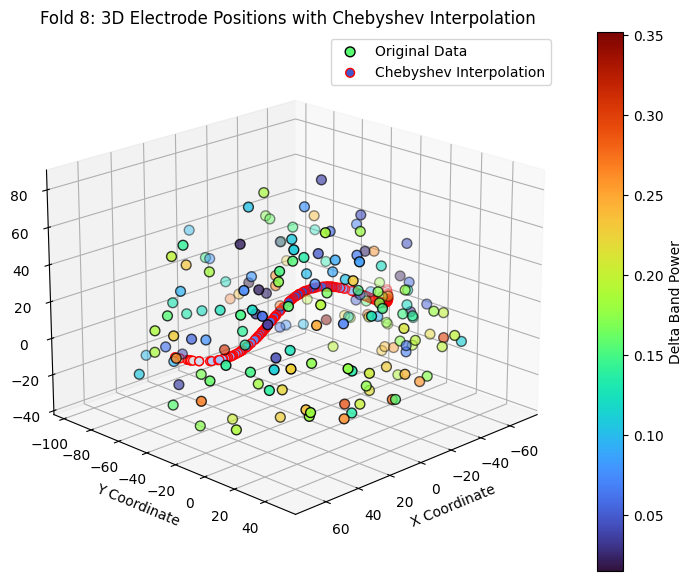


=== Fold 9 ===
MSE  : 0.0041
MAE  : 0.0529
RMSE : 0.0637
R²   : -0.0289


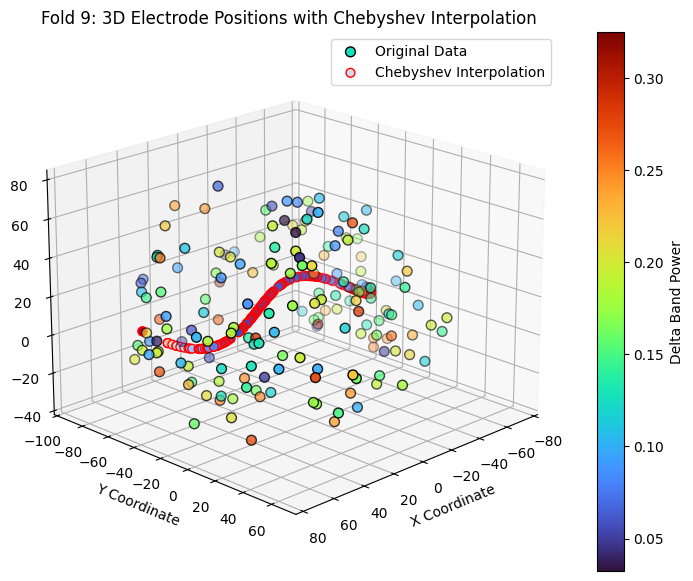


=== Fold 10 ===
MSE  : 0.0046
MAE  : 0.0568
RMSE : 0.0681
R²   : 0.0082


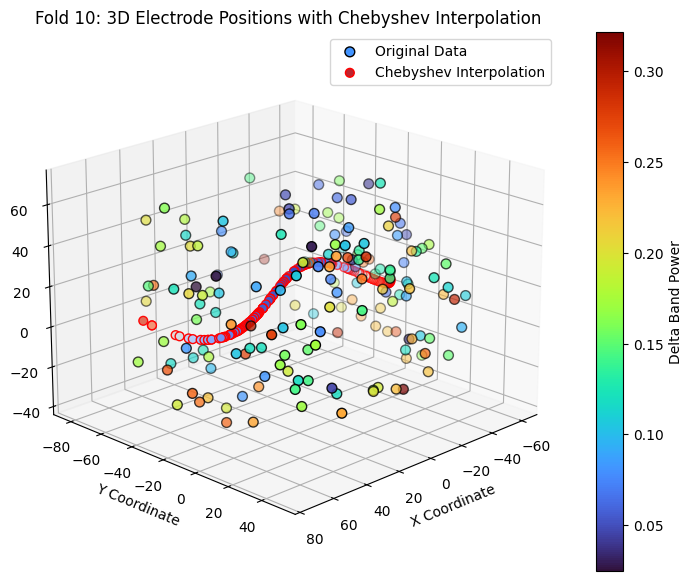


=== Final Evaluation Across 10 Folds ===
Mean MSE  : 0.0048 ± 0.0004
Mean MAE  : 0.0571 ± 0.0025
Mean RMSE : 0.0693 ± 0.0031
Mean R²   : -0.0021 ± 0.0121

T-test between MSE and MAE across folds:
T-statistic: -76.1275, P-value: 0.0000
Significant difference found (p < 0.05), suggesting MSE and MAE distributions are different.


In [5]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.polynomial.chebyshev import Chebyshev
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from scipy.stats import ttest_rel  # T-test for paired samples

# Load dataset
samples = np.load('coords.npy')  # 3D electrode coordinates
band_powers = np.load('band_powers.npy', allow_pickle=True).item()  # Frequency band power data

# Convert to NumPy arrays to avoid indexing issues
X = np.array(samples[:, 0])
Y = np.array(samples[:, 1])
Z = np.array(samples[:, 2])
delta_powers = np.array(band_powers['Delta'])  # Ensure it's a NumPy array

# Define KFold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Function to compute evaluation metrics
def compute_metrics(true_values, predicted_values):
    """Compute evaluation metrics: MSE, MAE, RMSE, R²."""
    mse = mean_squared_error(true_values, predicted_values)
    mae = mean_absolute_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    r2 = r2_score(true_values, predicted_values)
    return mse, mae, rmse, r2

# Store evaluation metrics
mse_scores = []
mae_scores = []
rmse_scores = []
r2_scores = []

# Perform 10-fold cross-validation
fold = 1
for train_index, test_index in kf.split(X):
    print(f"\n=== Fold {fold} ===")

    # Split data into training and testing sets
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]
    Z_train, Z_test = Z[train_index], Z[test_index]
    Delta_train, Delta_test = delta_powers[train_index], delta_powers[test_index]

    # Sort X_train to ensure monotonicity for Chebyshev fitting
    sort_idx = np.argsort(X_train)
    X_train = X_train[sort_idx]
    Y_train = Y_train[sort_idx]
    Z_train = Z_train[sort_idx]
    Delta_train = Delta_train[sort_idx]

    # Fit Chebyshev polynomials for Y, Z, and Delta band power
    chebyshev_y = Chebyshev.fit(X_train, Y_train, deg=5)
    chebyshev_z = Chebyshev.fit(X_train, Z_train, deg=5)
    chebyshev_delta = Chebyshev.fit(X_train, Delta_train, deg=5)

    # Interpolate values for test X positions
    Y_interp = chebyshev_y(X_test)
    Z_interp = chebyshev_z(X_test)
    Delta_interp = chebyshev_delta(X_test)

    # Compute metrics for this fold
    mse, mae, rmse, r2 = compute_metrics(Delta_test, Delta_interp)

    # Store scores
    mse_scores.append(mse)
    mae_scores.append(mae)
    rmse_scores.append(rmse)
    r2_scores.append(r2)

    # Print evaluation metrics
    print(f"MSE  : {mse:.4f}")
    print(f"MAE  : {mae:.4f}")
    print(f"RMSE : {rmse:.4f}")
    print(f"R²   : {r2:.4f}")

    # Plot 3D interpolation result
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Original test data points
    sc = ax.scatter(X_test, Y_test, Z_test, c=Delta_test, cmap='turbo', label="Original Data", s=50, edgecolor='k')

    # Interpolated test data points
    sc_interp = ax.scatter(X_test, Y_interp, Z_interp, c=Delta_interp, cmap='coolwarm', label="Chebyshev Interpolation", s=40, edgecolor='r')

    # Color bar
    cbar = plt.colorbar(sc)
    cbar.set_label('Delta Band Power')

    # Axis labels
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.set_zlabel('Z Coordinate')
    ax.set_title(f'Fold {fold}: 3D Electrode Positions with Chebyshev Interpolation')

    # Show legend
    ax.legend()

    # Adjust view angle
    ax.view_init(elev=20, azim=45)

    # Show the plot
    plt.show()

    fold += 1

# Perform t-test to compare MSE and MAE scores across folds
t_stat, p_value = ttest_rel(mse_scores, mae_scores)  # Using paired t-test

# Print final evaluation
print("\n=== Final Evaluation Across 10 Folds ===")
print(f"Mean MSE  : {np.mean(mse_scores):.4f} ± {np.std(mse_scores):.4f}")
print(f"Mean MAE  : {np.mean(mae_scores):.4f} ± {np.std(mae_scores):.4f}")
print(f"Mean RMSE : {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")
print(f"Mean R²   : {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")

# Print t-test results
print(f"\nT-test between MSE and MAE across folds:")
print(f"T-statistic: {t_stat:.4f}, P-value: {p_value:.4f}")

# Interpretation of t-test
if p_value < 0.05:
    print("Significant difference found (p < 0.05), suggesting MSE and MAE distributions are different.")
else:
    print("No significant difference found (p >= 0.05), suggesting MSE and MAE distributions are similar.")



=== Fold 1 ===
MSE  : 0.0099
MAE  : 0.0800
RMSE : 0.0997
R²   : -1.1213


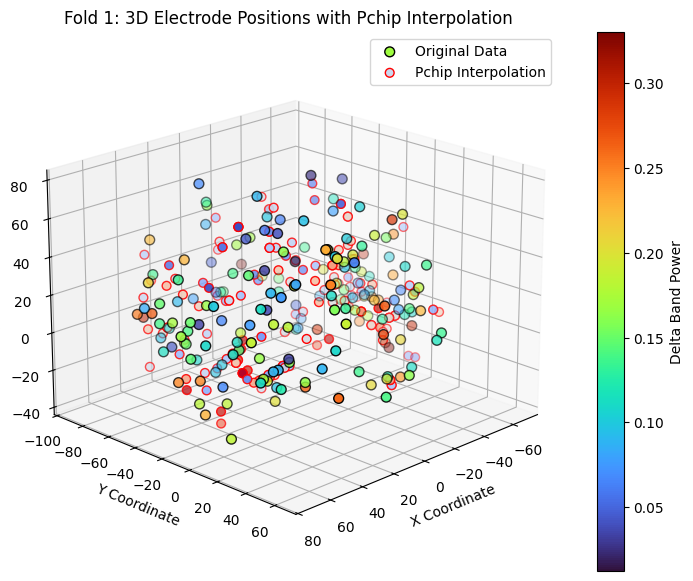


=== Fold 2 ===
MSE  : 0.0083
MAE  : 0.0728
RMSE : 0.0909
R²   : -0.5508


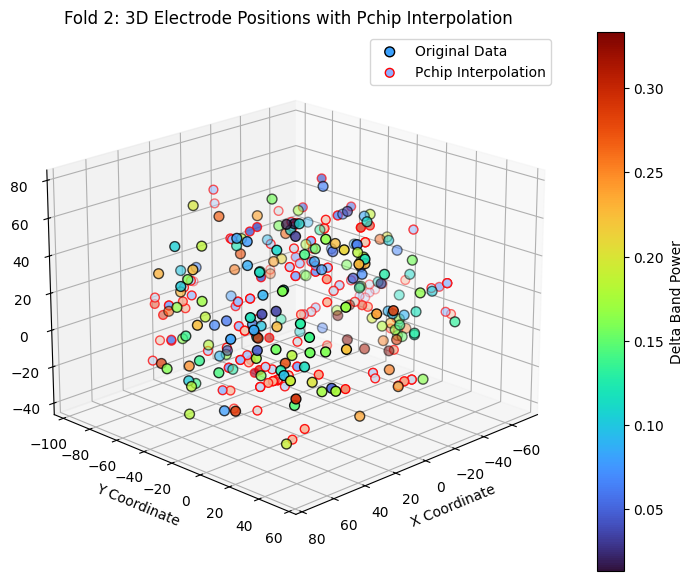


=== Fold 3 ===
MSE  : 0.0089
MAE  : 0.0765
RMSE : 0.0945
R²   : -0.6809


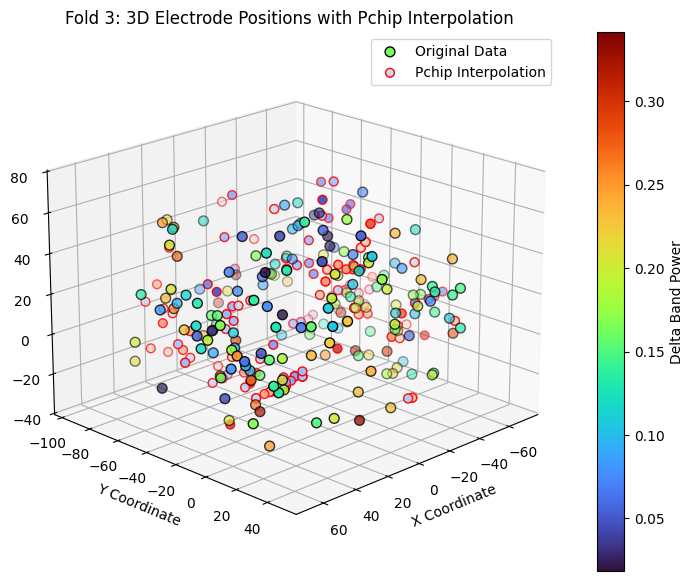


=== Fold 4 ===
MSE  : 0.0088
MAE  : 0.0727
RMSE : 0.0936
R²   : -1.0824


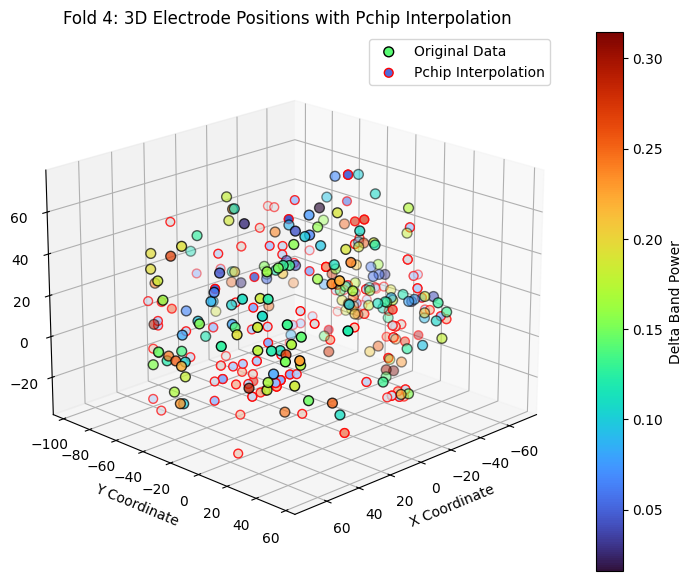


=== Fold 5 ===
MSE  : 0.0070
MAE  : 0.0667
RMSE : 0.0835
R²   : -0.4746


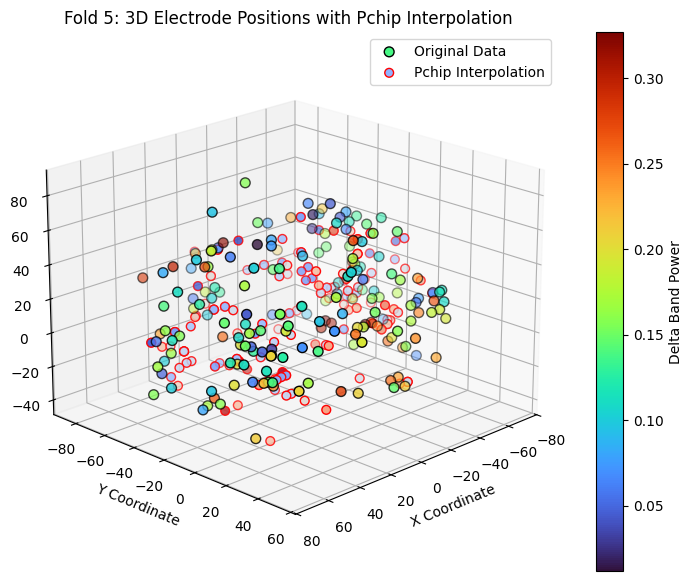


=== Fold 6 ===
MSE  : 0.0088
MAE  : 0.0759
RMSE : 0.0939
R²   : -0.8068


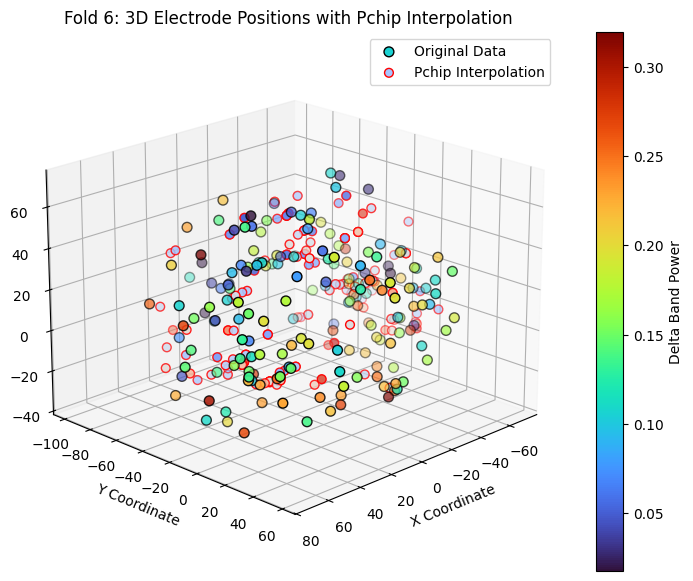


=== Fold 7 ===
MSE  : 0.0084
MAE  : 0.0738
RMSE : 0.0918
R²   : -0.6594


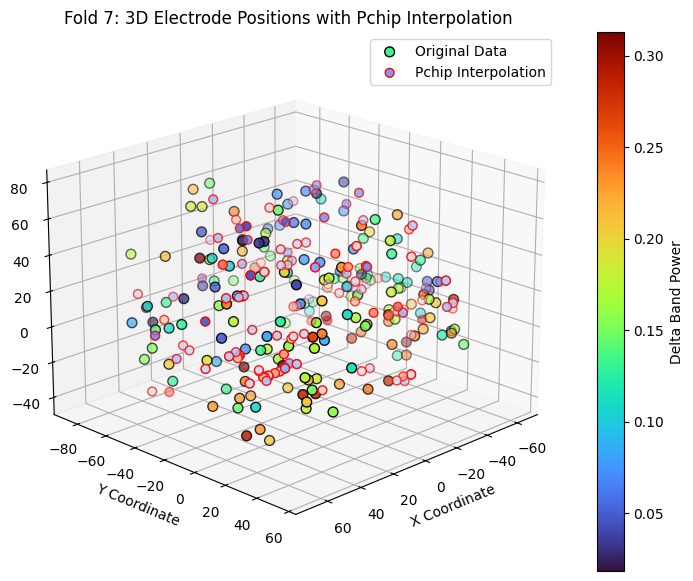


=== Fold 8 ===
MSE  : 0.0090
MAE  : 0.0792
RMSE : 0.0949
R²   : -0.7579


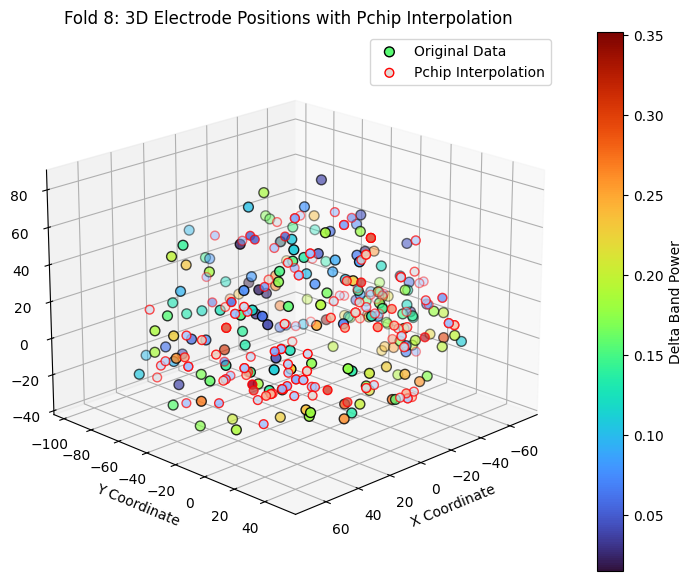


=== Fold 9 ===
MSE  : 0.0084
MAE  : 0.0724
RMSE : 0.0914
R²   : -1.1174


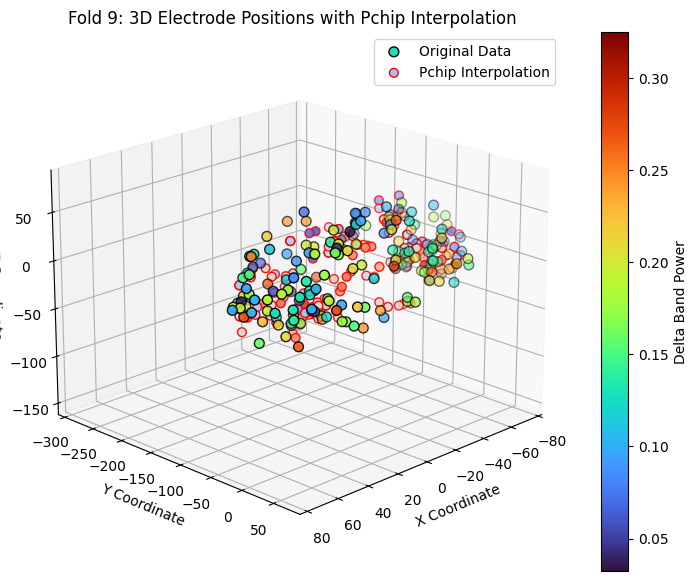


=== Fold 10 ===
MSE  : 0.0068
MAE  : 0.0681
RMSE : 0.0824
R²   : -0.4499


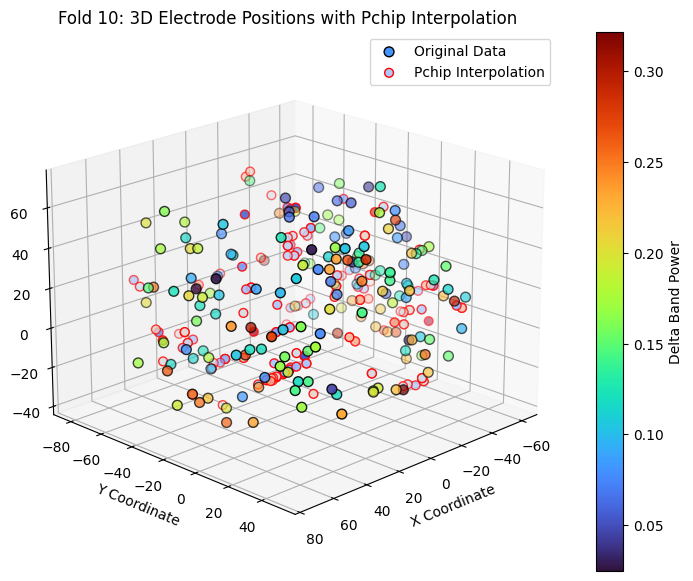


=== Final Evaluation Across 10 Folds ===
Mean MSE  : 0.0084 ± 0.0009
Mean MAE  : 0.0738 ± 0.0041
Mean RMSE : 0.0917 ± 0.0049
Mean R²   : -0.7701 ± 0.2452

T-test between MSE and MAE across folds:
T-statistic: -60.1308, P-value: 0.0000
Significant difference found (p < 0.05), suggesting MSE and MAE distributions are different.


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import PchipInterpolator
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from scipy.stats import ttest_rel  # T-test for paired samples

# Load dataset
samples = np.load('coords.npy')  # 3D electrode coordinates
band_powers = np.load('band_powers.npy', allow_pickle=True).item()  # Frequency band power data

# Convert to NumPy arrays to avoid indexing issues
X = np.array(samples[:, 0])
Y = np.array(samples[:, 1])
Z = np.array(samples[:, 2])
delta_powers = np.array(band_powers['Delta'])  # Ensure it's a NumPy array

# Define KFold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Function to compute evaluation metrics
def compute_metrics(true_values, predicted_values):
    """Compute evaluation metrics: MSE, MAE, RMSE, R²."""
    mse = mean_squared_error(true_values, predicted_values)
    mae = mean_absolute_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    r2 = r2_score(true_values, predicted_values)
    return mse, mae, rmse, r2

# Store evaluation metrics
mse_scores = []
mae_scores = []
rmse_scores = []
r2_scores = []

# Perform 10-fold cross-validation
fold = 1
for train_index, test_index in kf.split(X):
    print(f"\n=== Fold {fold} ===")

    # Split data into training and testing sets
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]
    Z_train, Z_test = Z[train_index], Z[test_index]
    Delta_train, Delta_test = delta_powers[train_index], delta_powers[test_index]

    # Remove duplicate values in X_train
    unique_indices = np.unique(X_train, return_index=True)[1]
    X_train = X_train[unique_indices]
    Y_train = Y_train[unique_indices]
    Z_train = Z_train[unique_indices]
    Delta_train = Delta_train[unique_indices]

    # Fit PchipInterpolator for Y, Z, and Delta band power
    interp_y = PchipInterpolator(X_train, Y_train)
    interp_z = PchipInterpolator(X_train, Z_train)
    interp_delta = PchipInterpolator(X_train, Delta_train)

    # Interpolate values for test X positions
    Y_interp = interp_y(X_test)
    Z_interp = interp_z(X_test)
    Delta_interp = interp_delta(X_test)

    # Compute metrics for this fold
    mse, mae, rmse, r2 = compute_metrics(Delta_test, Delta_interp)

    # Store scores
    mse_scores.append(mse)
    mae_scores.append(mae)
    rmse_scores.append(rmse)
    r2_scores.append(r2)

    # Print evaluation metrics
    print(f"MSE  : {mse:.4f}")
    print(f"MAE  : {mae:.4f}")
    print(f"RMSE : {rmse:.4f}")
    print(f"R²   : {r2:.4f}")

    # Plot 3D interpolation result
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Original test data points
    sc = ax.scatter(X_test, Y_test, Z_test, c=Delta_test, cmap='turbo', label="Original Data", s=50, edgecolor='k')

    # Interpolated test data points
    sc_interp = ax.scatter(X_test, Y_interp, Z_interp, c=Delta_interp, cmap='coolwarm', label="Pchip Interpolation", s=40, edgecolor='r')

    # Color bar
    cbar = plt.colorbar(sc)
    cbar.set_label('Delta Band Power')

    # Axis labels
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.set_zlabel('Z Coordinate')
    ax.set_title(f'Fold {fold}: 3D Electrode Positions with Pchip Interpolation')

    # Show legend
    ax.legend()

    # Adjust view angle
    ax.view_init(elev=20, azim=45)

    # Show the plot
    plt.show()

    fold += 1

# Perform t-test to compare MSE and MAE scores across folds
t_stat, p_value = ttest_rel(mse_scores, mae_scores)  # Using paired t-test

# Print final evaluation
print("\n=== Final Evaluation Across 10 Folds ===")
print(f"Mean MSE  : {np.mean(mse_scores):.4f} ± {np.std(mse_scores):.4f}")
print(f"Mean MAE  : {np.mean(mae_scores):.4f} ± {np.std(mae_scores):.4f}")
print(f"Mean RMSE : {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")
print(f"Mean R²   : {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")

# Print t-test results
print(f"\nT-test between MSE and MAE across folds:")
print(f"T-statistic: {t_stat:.4f}, P-value: {p_value:.4f}")

# Interpretation of t-test
if p_value < 0.05:
    print("Significant difference found (p < 0.05), suggesting MSE and MAE distributions are different.")
else:
    print("No significant difference found (p >= 0.05), suggesting MSE and MAE distributions are similar.")


In [7]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import BarycentricInterpolator
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from scipy.stats import ttest_rel  # T-test for paired samples

# Load dataset
samples = np.load('coords.npy')  # 3D electrode coordinates
band_powers = np.load('band_powers.npy', allow_pickle=True).item()  # Frequency band power data

# Convert to NumPy arrays to avoid indexing issues
X = np.array(samples[:, 0])
Y = np.array(samples[:, 1])
Z = np.array(samples[:, 2])
delta_powers = np.array(band_powers['Delta'])  # Ensure it's a NumPy array

# Define KFold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Function to compute evaluation metrics
def compute_metrics(true_values, predicted_values):
    """Compute evaluation metrics: MSE, MAE, RMSE, R²."""
    mse = mean_squared_error(true_values, predicted_values)
    mae = mean_absolute_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    r2 = r2_score(true_values, predicted_values)
    return mse, mae, rmse, r2

# Store evaluation metrics
mse_scores = []
mae_scores = []
rmse_scores = []
r2_scores = []

# Perform 10-fold cross-validation
fold = 1
for train_index, test_index in kf.split(X):
    print(f"\n=== Fold {fold} ===")

    # Split data into training and testing sets
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]
    Z_train, Z_test = Z[train_index], Z[test_index]
    Delta_train, Delta_test = delta_powers[train_index], delta_powers[test_index]

    # Remove duplicate X values
    unique_indices = np.unique(X_train, return_index=True)[1]
    X_train = X_train[unique_indices]
    Y_train = Y_train[unique_indices]
    Z_train = Z_train[unique_indices]
    Delta_train = Delta_train[unique_indices]

    # If after removing duplicates we only have 1 point, use a simple constant function
    if len(X_train) < 2:
        print(f"Warning: Only one unique X value in Fold {fold}, switching to constant interpolation.")
        interp_y = lambda x: np.full_like(x, Y_train[0])
        interp_z = lambda x: np.full_like(x, Z_train[0])
        interp_delta = lambda x: np.full_like(x, Delta_train[0])
    else:
        interp_y = BarycentricInterpolator(X_train, Y_train)
        interp_z = BarycentricInterpolator(X_train, Z_train)
        interp_delta = BarycentricInterpolator(X_train, Delta_train)

    # Interpolate values for test X positions
    Y_interp = interp_y(X_test)
    Z_interp = interp_z(X_test)
    Delta_interp = interp_delta(X_test)

    # Compute metrics for this fold
    mse, mae, rmse, r2 = compute_metrics(Delta_test, Delta_interp)

    # Store scores
    mse_scores.append(mse)
    mae_scores.append(mae)
    rmse_scores.append(rmse)
    r2_scores.append(r2)

    # Print evaluation metrics
    print(f"MSE  : {mse:.4f}")
    print(f"MAE  : {mae:.4f}")
    print(f"RMSE : {rmse:.4f}")
    print(f"R²   : {r2:.4f}")

    fold += 1

# Perform t-test to compare MSE and MAE scores across folds
t_stat, p_value = ttest_rel(mse_scores, mae_scores)  # Using paired t-test

# Print final evaluation
print("\n=== Final Evaluation Across 10 Folds ===")
print(f"Mean MSE  : {np.mean(mse_scores):.4f} ± {np.std(mse_scores):.4f}")
print(f"Mean MAE  : {np.mean(mae_scores):.4f} ± {np.std(mae_scores):.4f}")
print(f"Mean RMSE : {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")
print(f"Mean R²   : {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")

# Print t-test results
print(f"\nT-test between MSE and MAE across folds:")
print(f"T-statistic: {t_stat:.4f}, P-value: {p_value:.4f}")

# Interpretation of t-test
if p_value < 0.05:
    print("Significant difference found (p < 0.05), suggesting MSE and MAE distributions are different.")
else:
    print("No significant difference found (p >= 0.05), suggesting MSE and MAE distributions are similar.")



=== Fold 1 ===
MSE  : 31111058630973750195263635456.0000
MAE  : 51674169405938.5156
RMSE : 176383271970370.6875
R²   : -6644243956227068782708348944384.0000

=== Fold 2 ===
MSE  : 8032168515911379427786752.0000
MAE  : 822636244044.3057
RMSE : 2834108063555.6895
R²   : -1508541415686287480361844736.0000

=== Fold 3 ===
MSE  : 2662131922305915239268352.0000
MAE  : 577443213699.1282
RMSE : 1631604094842.2246
R²   : -500771067531361462186409984.0000

=== Fold 4 ===
MSE  : 2447674732132814477590528.0000
MAE  : 578383755144.9028
RMSE : 1564504628351.3560
R²   : -581773569539451368425652224.0000

=== Fold 5 ===
MSE  : 2107000343152548030447616.0000
MAE  : 579216094490.4265
RMSE : 1451551012934.9736
R²   : -445349618102045109578104832.0000

=== Fold 6 ===
MSE  : 1228813432426506643046400.0000
MAE  : 340578018926.3386
RMSE : 1108518575589.2893
R²   : -251569161528678979368648704.0000

=== Fold 7 ===
MSE  : 1287371964709532761849856.0000
MAE  : 359119890544.4721
RMSE : 1134624151298.3640
R²   :


=== Fold 1 ===
MSE  : 0.1519
MAE  : 0.1318
RMSE : 0.3897
R²   : -31.4356


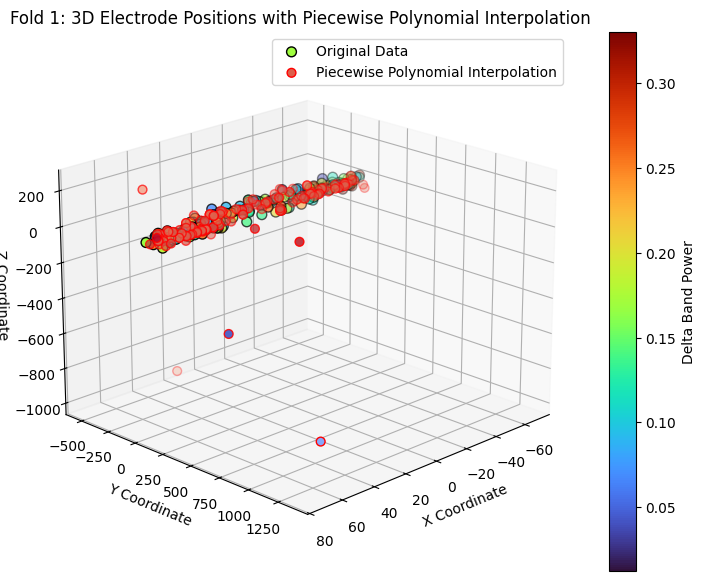


=== Fold 2 ===
MSE  : 1.6767
MAE  : 0.2264
RMSE : 1.2949
R²   : -313.9000


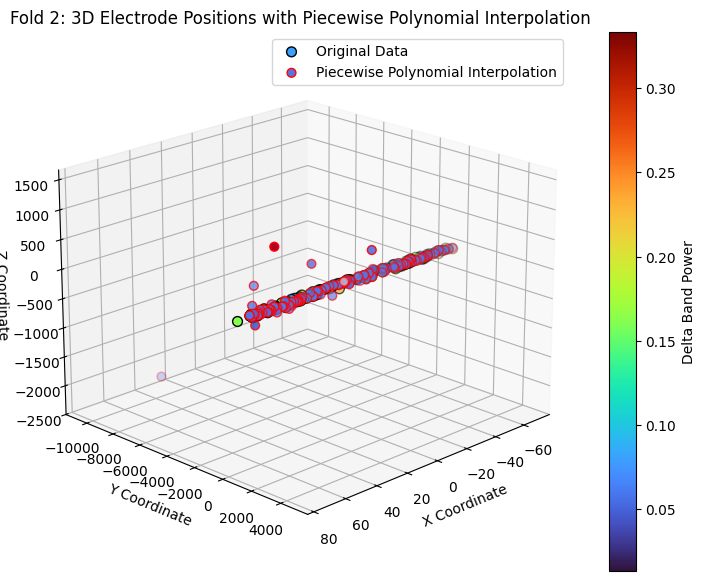


=== Fold 3 ===
MSE  : 673747031862998728704.0000
MAE  : 2578024412.8191
RMSE : 25956637529.9845
R²   : -126737904145589164048384.0000


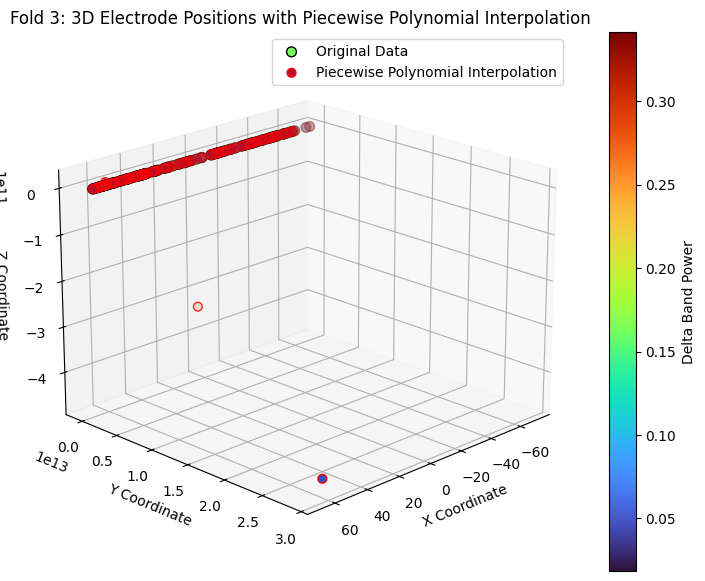


=== Fold 4 ===
MSE  : 768803580360337.1250
MAE  : 2132988.5686
RMSE : 27727307.4849
R²   : -182732451068451168.0000


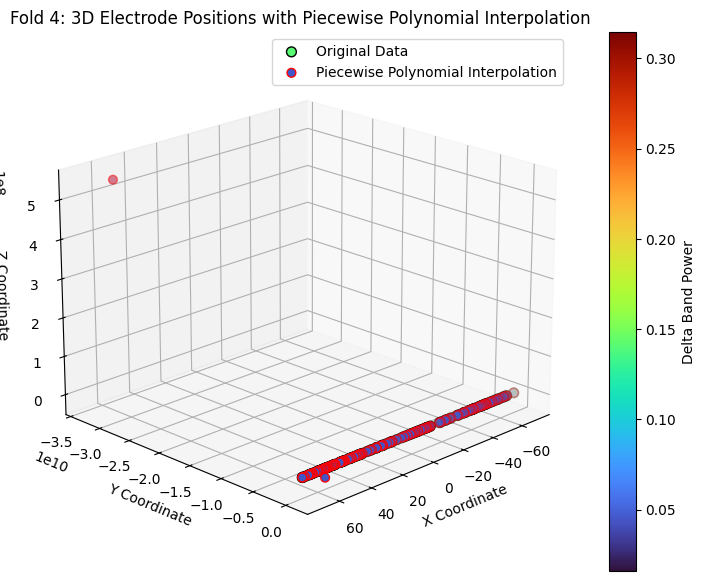


=== Fold 5 ===
MSE  : 3309333208869599744.0000
MAE  : 136736803.6508
RMSE : 1819157279.8605
R²   : -699482696114486116352.0000


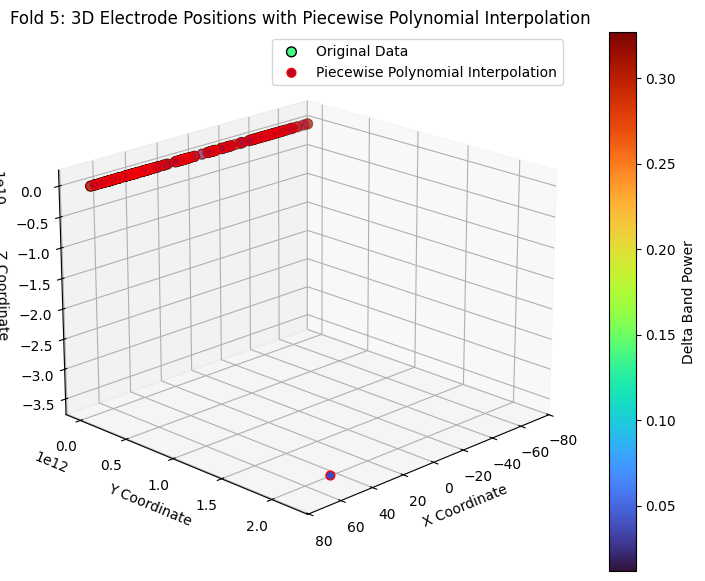


=== Fold 6 ===
MSE  : 2385482732254427873280.0000
MAE  : 4152747287.9492
RMSE : 48841403872.6819
R²   : -488368596044200936472576.0000


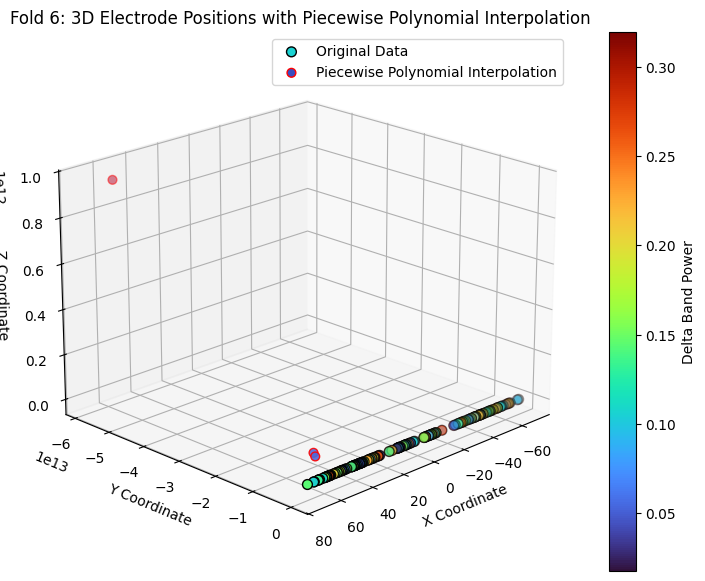


=== Fold 7 ===
MSE  : 6.5205
MAE  : 0.2815
RMSE : 2.5535
R²   : -1282.2808


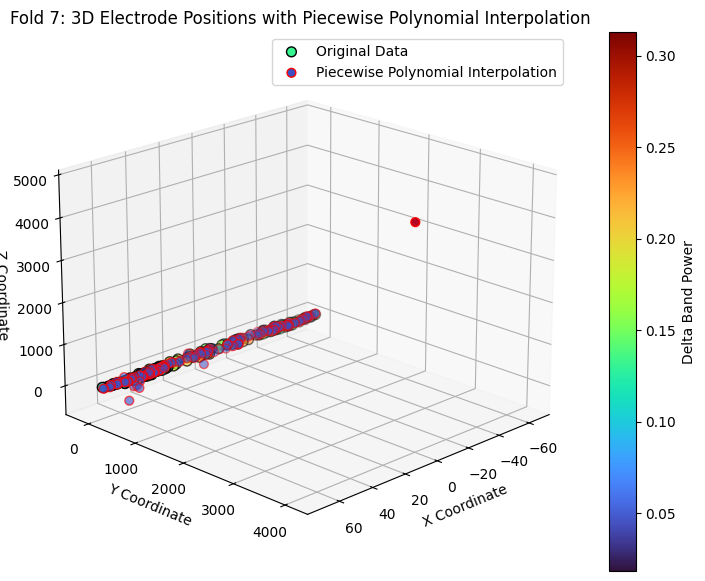


=== Fold 8 ===
MSE  : 56987857338398121984.0000
MAE  : 567808919.9849
RMSE : 7549030225.0288
R²   : -11133419647979623546880.0000


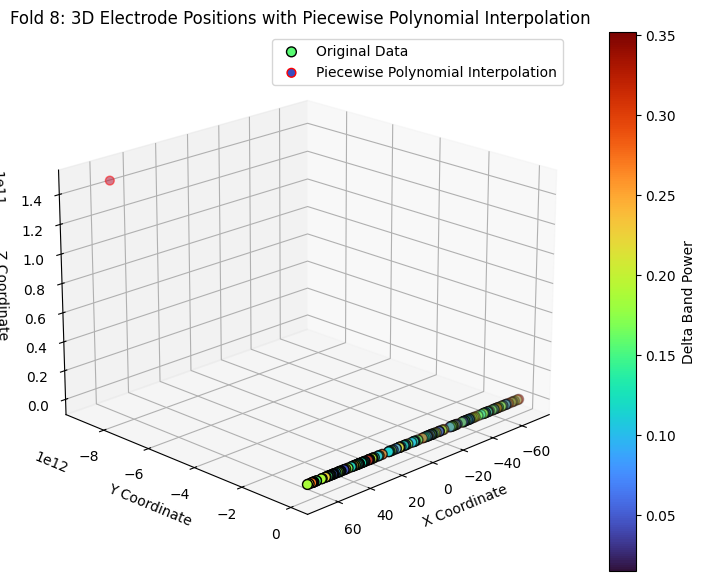


=== Fold 9 ===
MSE  : 304133955202053312.0000
MAE  : 53237867.8196
RMSE : 551483413.3517
R²   : -77026754875071053824.0000


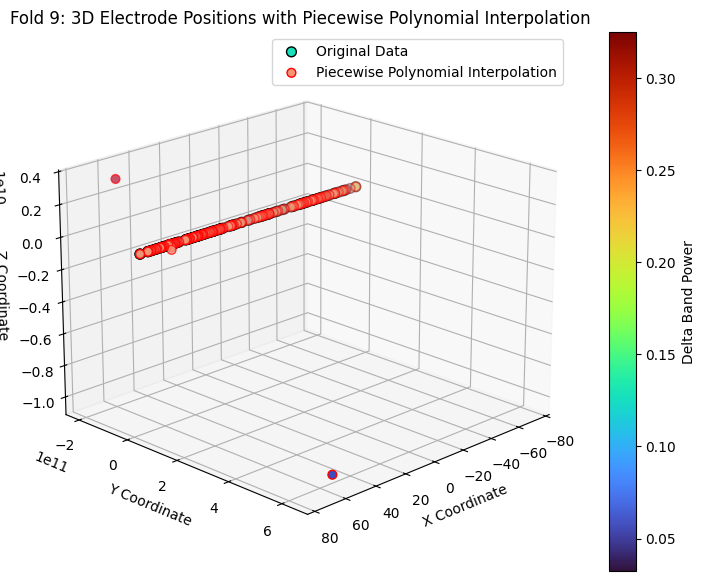


=== Fold 10 ===
MSE  : 2104847.4332
MAE  : 109.2042
RMSE : 1450.8092
R²   : -449554835.3358


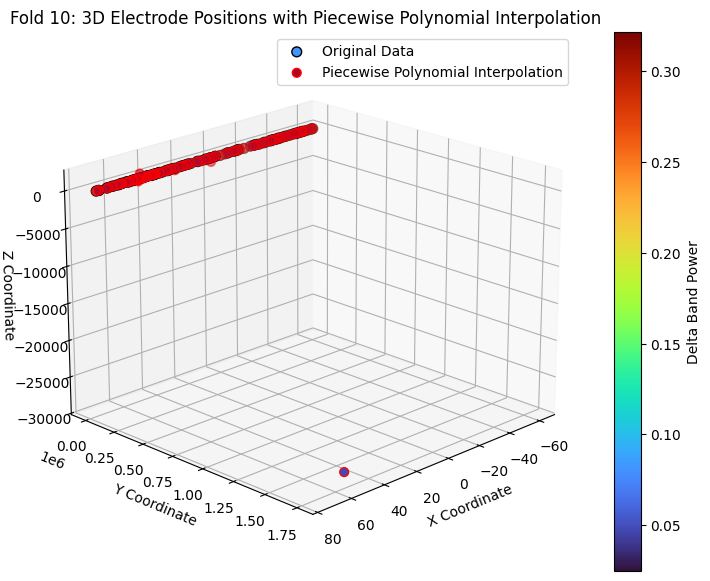


=== Final Evaluation Across 10 Folds ===
Mean MSE  : 311983185742347829248.0000 ± 719332086524518334464.0000
Mean MAE  : 749068839.0636 ± 1364713207.8718
Mean RMSE : 8474544108.3440 ± 15497267110.6257
Mean R²   : -62701661202121075195904.0000 ± 146756889792813216038912.0000

T-test between MSE and MAE across folds:
T-statistic: 1.3011, P-value: 0.2255
No significant difference found (p >= 0.05), suggesting MSE and MAE distributions are similar.


In [10]:
# Piecewise Polynomial
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import PPoly, splrep, splev
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from scipy.stats import ttest_rel  # T-test for paired samples

# Load dataset
samples = np.load('coords.npy')  # 3D electrode coordinates
band_powers = np.load('band_powers.npy', allow_pickle=True).item()  # Frequency band power data

# Convert to NumPy arrays to avoid indexing issues
X = np.array(samples[:, 0])
Y = np.array(samples[:, 1])
Z = np.array(samples[:, 2])
delta_powers = np.array(band_powers['Delta'])  # Ensure it's a NumPy array

# Define KFold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Function to compute evaluation metrics
def compute_metrics(true_values, predicted_values):
    """Compute evaluation metrics: MSE, MAE, RMSE, R²."""
    mse = mean_squared_error(true_values, predicted_values)
    mae = mean_absolute_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    r2 = r2_score(true_values, predicted_values)
    return mse, mae, rmse, r2

# Store evaluation metrics
mse_scores = []
mae_scores = []
rmse_scores = []
r2_scores = []

# Perform 10-fold cross-validation
fold = 1
for train_index, test_index in kf.split(X):
    print(f"\n=== Fold {fold} ===")

    # Split data into training and testing sets
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]
    Z_train, Z_test = Z[train_index], Z[test_index]
    Delta_train, Delta_test = delta_powers[train_index], delta_powers[test_index]

    # Remove duplicate X values to ensure monotonicity
    unique_indices = np.unique(X_train, return_index=True)[1]
    X_train = X_train[unique_indices]
    Y_train = Y_train[unique_indices]
    Z_train = Z_train[unique_indices]
    Delta_train = Delta_train[unique_indices]

    # Ensure X_train is strictly increasing
    if len(X_train) < 2:
        print(f"Warning: Only one unique X value in Fold {fold}, switching to constant interpolation.")
        interp_y = lambda x: np.full_like(x, Y_train[0])
        interp_z = lambda x: np.full_like(x, Z_train[0])
        interp_delta = lambda x: np.full_like(x, Delta_train[0])
    else:
        # Fit Piecewise Polynomial (PPoly) interpolators
        tck_y = splrep(X_train, Y_train, k=5)  # 5 阶分段多项式
        tck_z = splrep(X_train, Z_train, k=5)
        tck_delta = splrep(X_train, Delta_train, k=5)

        interp_y = PPoly.from_spline(tck_y)
        interp_z = PPoly.from_spline(tck_z)
        interp_delta = PPoly.from_spline(tck_delta)

    # Interpolate values for test X positions
    Y_interp = interp_y(X_test)
    Z_interp = interp_z(X_test)
    Delta_interp = interp_delta(X_test)

    # Compute metrics for this fold
    mse, mae, rmse, r2 = compute_metrics(Delta_test, Delta_interp)

    # Store scores
    mse_scores.append(mse)
    mae_scores.append(mae)
    rmse_scores.append(rmse)
    r2_scores.append(r2)

    # Print evaluation metrics
    print(f"MSE  : {mse:.4f}")
    print(f"MAE  : {mae:.4f}")
    print(f"RMSE : {rmse:.4f}")
    print(f"R²   : {r2:.4f}")

    # Plot 3D interpolation result
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Original test data points
    sc = ax.scatter(X_test, Y_test, Z_test, c=Delta_test, cmap='turbo', label="Original Data", s=50, edgecolor='k')

    # Interpolated test data points
    sc_interp = ax.scatter(X_test, Y_interp, Z_interp, c=Delta_interp, cmap='coolwarm', label="Piecewise Polynomial Interpolation", s=40, edgecolor='r')

    # Color bar
    cbar = plt.colorbar(sc)
    cbar.set_label('Delta Band Power')

    # Axis labels
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.set_zlabel('Z Coordinate')
    ax.set_title(f'Fold {fold}: 3D Electrode Positions with Piecewise Polynomial Interpolation')

    # Show legend
    ax.legend()

    # Adjust view angle
    ax.view_init(elev=20, azim=45)

    # Show the plot
    plt.show()

    fold += 1

# Perform t-test to compare MSE and MAE scores across folds
t_stat, p_value = ttest_rel(mse_scores, mae_scores)  # Using paired t-test

# Print final evaluation
print("\n=== Final Evaluation Across 10 Folds ===")
print(f"Mean MSE  : {np.mean(mse_scores):.4f} ± {np.std(mse_scores):.4f}")
print(f"Mean MAE  : {np.mean(mae_scores):.4f} ± {np.std(mae_scores):.4f}")
print(f"Mean RMSE : {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")
print(f"Mean R²   : {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")

# Print t-test results
print(f"\nT-test between MSE and MAE across folds:")
print(f"T-statistic: {t_stat:.4f}, P-value: {p_value:.4f}")

# Interpretation of t-test
if p_value < 0.05:
    print("Significant difference found (p < 0.05), suggesting MSE and MAE distributions are different.")
else:
    print("No significant difference found (p >= 0.05), suggesting MSE and MAE distributions are similar.")



=== Fold 1 ===
MSE  : 0.0050
MAE  : 0.0579
RMSE : 0.0705
R²   : -0.0627
X_test shape: (178, 1), Y_test shape: (178,), Z_test shape: (178,)
Delta_interp shape: (178,)


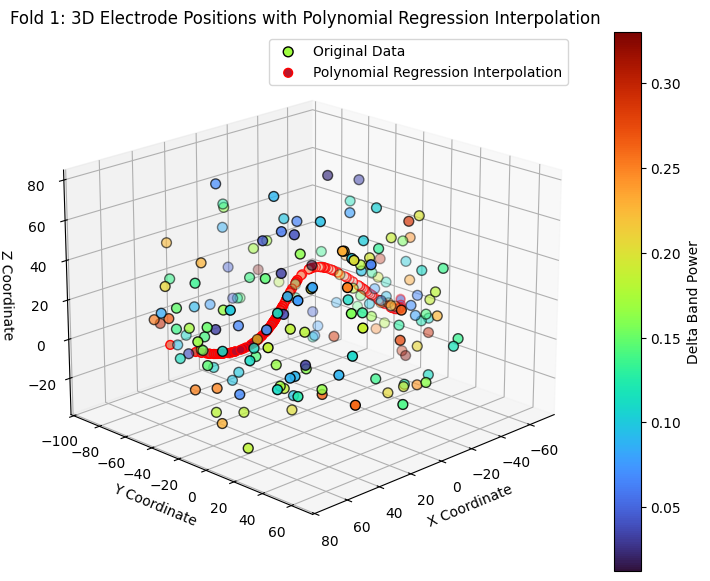


=== Fold 2 ===
MSE  : 0.0054
MAE  : 0.0593
RMSE : 0.0733
R²   : -0.0084
X_test shape: (178, 1), Y_test shape: (178,), Z_test shape: (178,)
Delta_interp shape: (178,)


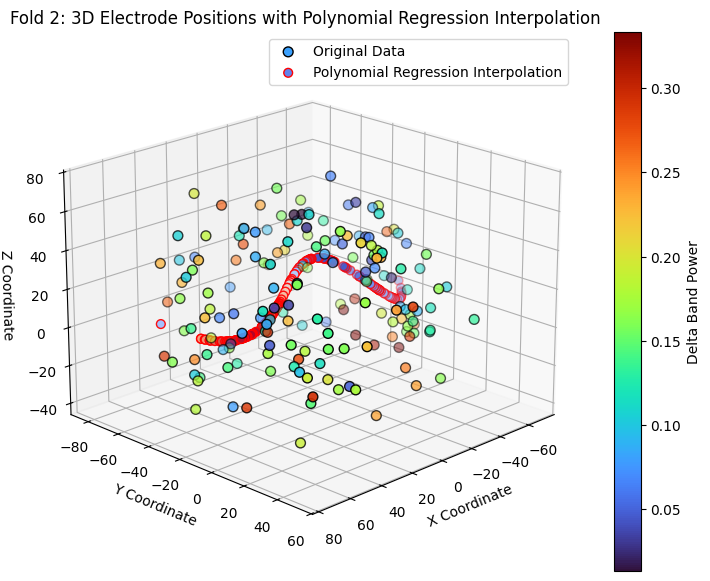


=== Fold 3 ===
MSE  : 0.0055
MAE  : 0.0610
RMSE : 0.0740
R²   : -0.0287
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


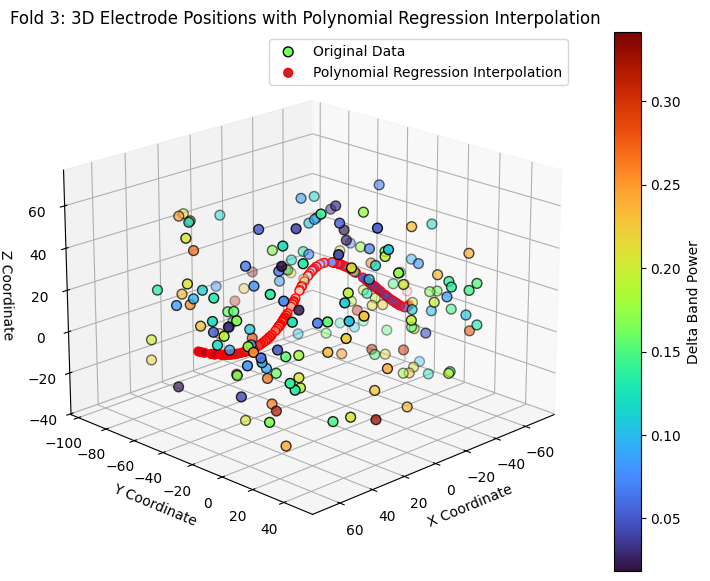


=== Fold 4 ===
MSE  : 0.0043
MAE  : 0.0541
RMSE : 0.0653
R²   : -0.0125
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


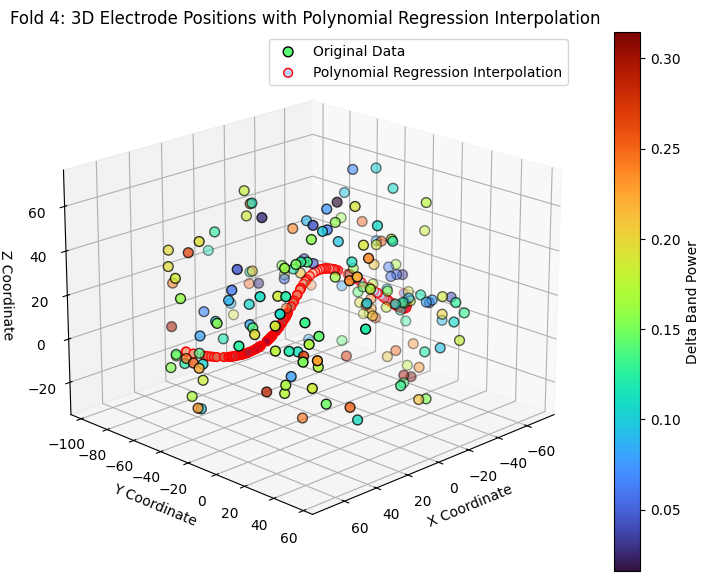


=== Fold 5 ===
MSE  : 0.0049
MAE  : 0.0567
RMSE : 0.0699
R²   : -0.0339
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


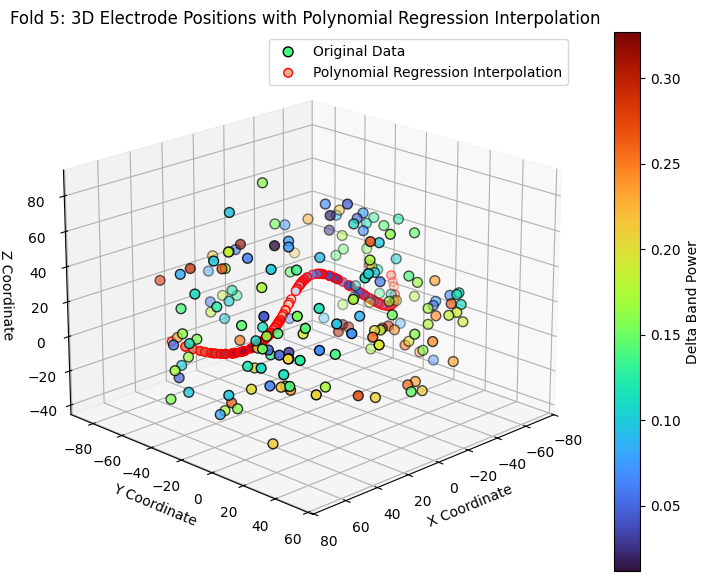


=== Fold 6 ===
MSE  : 0.0050
MAE  : 0.0593
RMSE : 0.0704
R²   : -0.0150
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


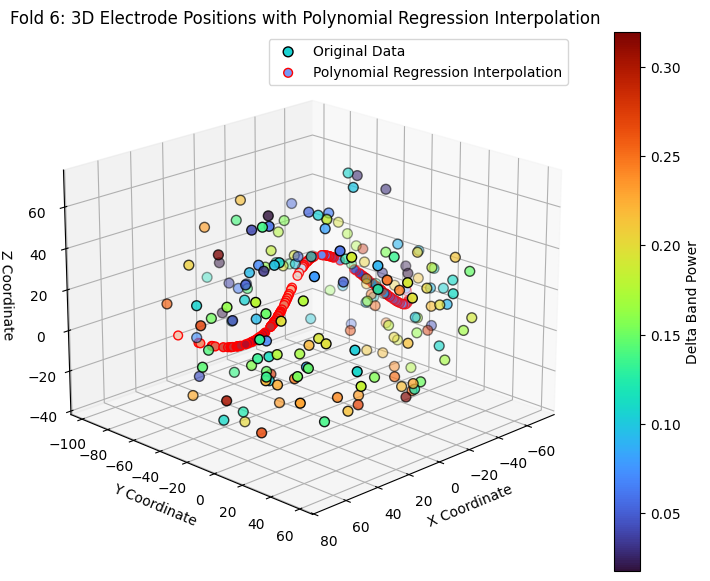


=== Fold 7 ===
MSE  : 0.0052
MAE  : 0.0586
RMSE : 0.0718
R²   : -0.0139
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


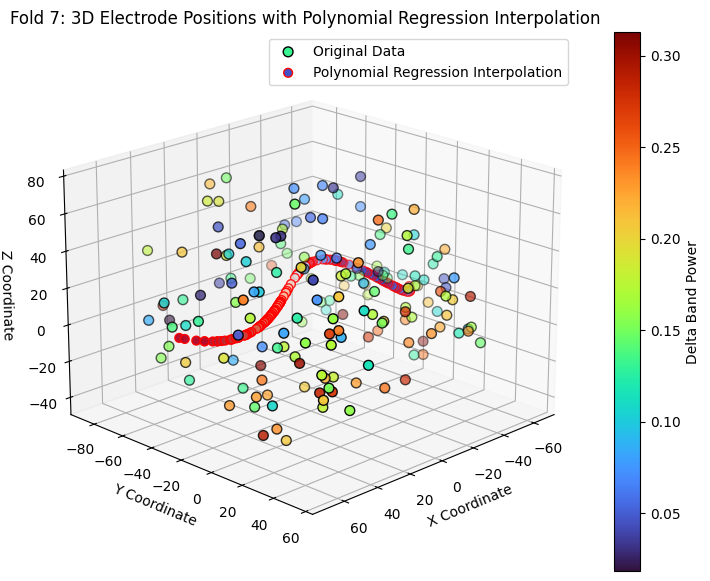


=== Fold 8 ===
MSE  : 0.0053
MAE  : 0.0602
RMSE : 0.0728
R²   : -0.0368
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


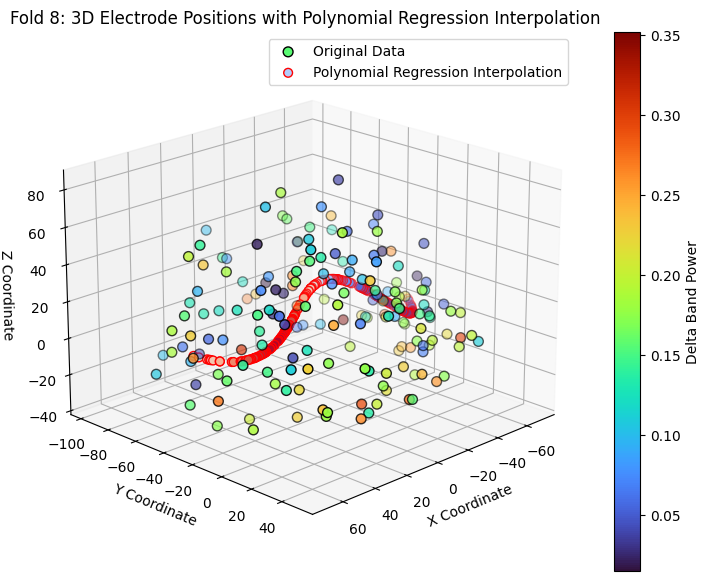


=== Fold 9 ===
MSE  : 0.0040
MAE  : 0.0527
RMSE : 0.0634
R²   : -0.0178
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


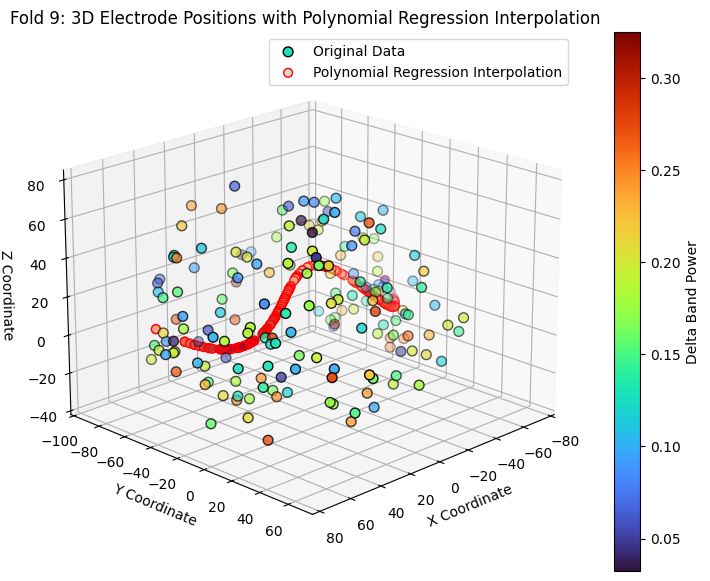


=== Fold 10 ===
MSE  : 0.0047
MAE  : 0.0572
RMSE : 0.0687
R²   : -0.0094
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


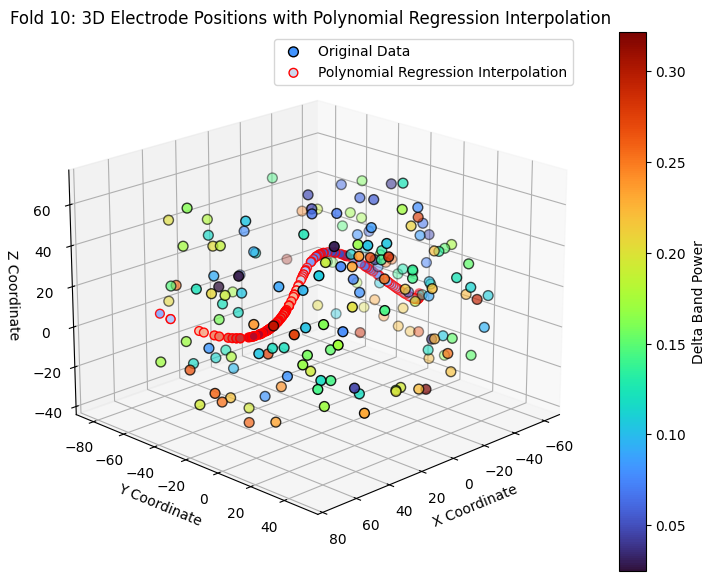


=== Final Evaluation Across 10 Folds ===
Mean MSE  : 0.0049 ± 0.0004
Mean MAE  : 0.0577 ± 0.0025
Mean RMSE : 0.0700 ± 0.0033
Mean R²   : -0.0239 ± 0.0161


In [14]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from scipy.stats import ttest_rel  # T-test for paired samples

# Load dataset
samples = np.load('coords.npy')  # 3D electrode coordinates
band_powers = np.load('band_powers.npy', allow_pickle=True).item()  # Frequency band power data

# Convert to NumPy arrays to avoid indexing issues
X = np.array(samples[:, 0]).reshape(-1, 1)
Y = np.array(samples[:, 1])
Z = np.array(samples[:, 2])
delta_powers = np.array(band_powers['Delta'])  # Ensure it's a NumPy array

# Define KFold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Function to compute evaluation metrics
def compute_metrics(true_values, predicted_values):
    """Compute evaluation metrics: MSE, MAE, RMSE, R²."""
    mse = mean_squared_error(true_values, predicted_values)
    mae = mean_absolute_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    r2 = r2_score(true_values, predicted_values)
    return mse, mae, rmse, r2

# Store evaluation metrics
mse_scores = []
mae_scores = []
rmse_scores = []
r2_scores = []

# Polynomial degree
degree = 4  # 可以调整阶数

# Perform 10-fold cross-validation
fold = 1
for train_index, test_index in kf.split(X):
    print(f"\n=== Fold {fold} ===")

    # Split data into training and testing sets
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]
    Z_train, Z_test = Z[train_index], Z[test_index]
    Delta_train, Delta_test = delta_powers[train_index], delta_powers[test_index]

    # Remove duplicate X values to ensure proper regression fitting
    unique_indices = np.unique(X_train, return_index=True)[1]
    X_train = X_train[unique_indices]
    Y_train = Y_train[unique_indices]
    Z_train = Z_train[unique_indices]
    Delta_train = Delta_train[unique_indices]

    # Transform features using polynomial basis
    poly = PolynomialFeatures(degree)
    X_poly_train = poly.fit_transform(X_train)

    # Train polynomial regression models
    model_y = LinearRegression().fit(X_poly_train, Y_train)
    model_z = LinearRegression().fit(X_poly_train, Z_train)
    model_delta = LinearRegression().fit(X_poly_train, Delta_train)

    # Transform test data
    X_poly_test = poly.transform(X_test)

    # Predict values
    Y_interp = model_y.predict(X_poly_test)
    Z_interp = model_z.predict(X_poly_test)
    Delta_interp = model_delta.predict(X_poly_test)

    # 修正 Delta_interp 的大小
    if len(Delta_interp) != len(X_test):
        print(f"Warning: Mismatched dimensions - X_test: {len(X_test)}, Delta_interp: {len(Delta_interp)}")
        Delta_interp = np.interp(X_test.flatten(), X_test.flatten(), Delta_interp.flatten())

    # 强制转换 Delta_interp 为 float64
    Delta_interp = np.array(Delta_interp, dtype=np.float64)

    # Compute metrics for this fold
    mse, mae, rmse, r2 = compute_metrics(Delta_test, Delta_interp)

    # Store scores
    mse_scores.append(mse)
    mae_scores.append(mae)
    rmse_scores.append(rmse)
    r2_scores.append(r2)

    # Print evaluation metrics
    print(f"MSE  : {mse:.4f}")
    print(f"MAE  : {mae:.4f}")
    print(f"RMSE : {rmse:.4f}")
    print(f"R²   : {r2:.4f}")

    # Plot 3D interpolation result
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Debugging print
    print(f"X_test shape: {X_test.shape}, Y_test shape: {Y_test.shape}, Z_test shape: {Z_test.shape}")
    print(f"Delta_interp shape: {Delta_interp.shape}")

    # Original test data points
    sc = ax.scatter(X_test.flatten(), Y_test, Z_test, c=Delta_test, cmap='turbo', label="Original Data", s=50, edgecolor='k')

    # Interpolated test data points
    sc_interp = ax.scatter(X_test.flatten(), Y_interp, Z_interp, c=Delta_interp, cmap='coolwarm', label="Polynomial Regression Interpolation", s=40, edgecolor='r')

    # Color bar
    cbar = plt.colorbar(sc)
    cbar.set_label('Delta Band Power')

    # Axis labels
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.set_zlabel('Z Coordinate')
    ax.set_title(f'Fold {fold}: 3D Electrode Positions with Polynomial Regression Interpolation')

    # Show legend
    ax.legend()

    # Adjust view angle
    ax.view_init(elev=20, azim=45)

    # Show the plot
    plt.show()

    fold += 1

# Perform t-test to compare MSE and MAE scores across folds
t_stat, p_value = ttest_rel(mse_scores, mae_scores)  # Using paired t-test

# Print final evaluation
print("\n=== Final Evaluation Across 10 Folds ===")
print(f"Mean MSE  : {np.mean(mse_scores):.4f} ± {np.std(mse_scores):.4f}")
print(f"Mean MAE  : {np.mean(mae_scores):.4f} ± {np.std(mae_scores):.4f}")
print(f"Mean RMSE : {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")
print(f"Mean R²   : {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")




=== Fold 1 ===
MSE  : 0.0050
MAE  : 0.0582
RMSE : 0.0710
R²   : -0.0764
X_test shape: (178, 1), Y_test shape: (178,), Z_test shape: (178,)
Delta_interp shape: (178,)


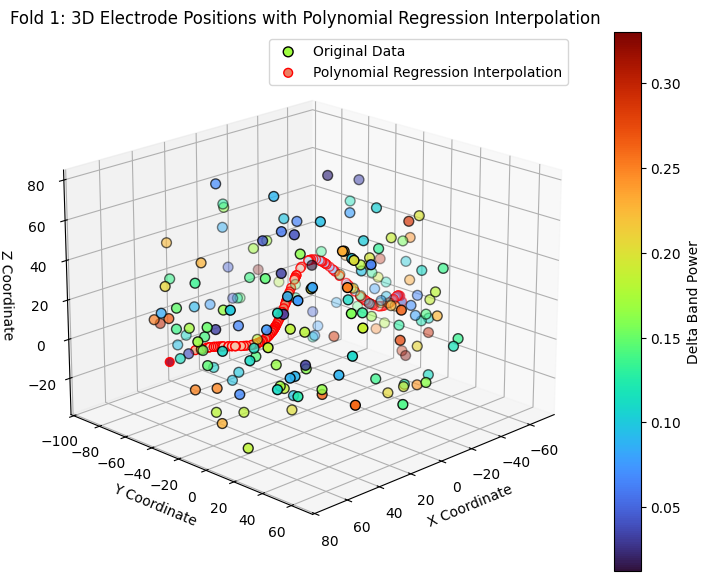


=== Fold 2 ===
MSE  : 0.0054
MAE  : 0.0597
RMSE : 0.0736
R²   : -0.0179
X_test shape: (178, 1), Y_test shape: (178,), Z_test shape: (178,)
Delta_interp shape: (178,)


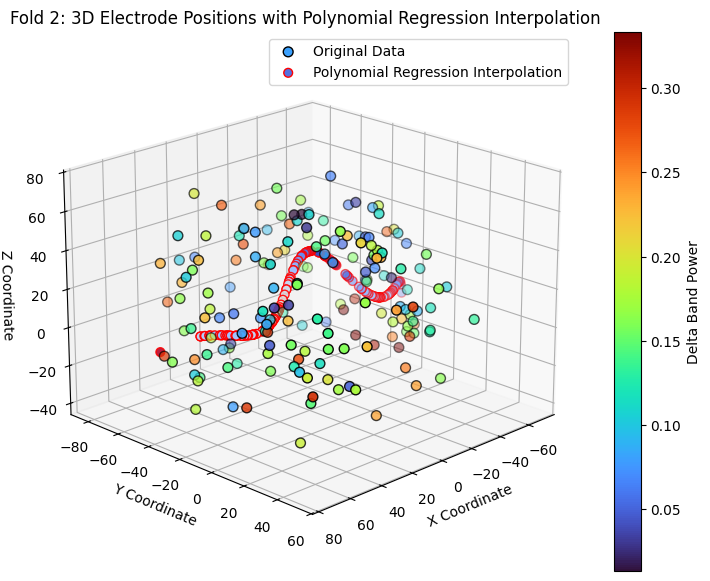


=== Fold 3 ===
MSE  : 0.0053
MAE  : 0.0602
RMSE : 0.0731
R²   : -0.0061
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


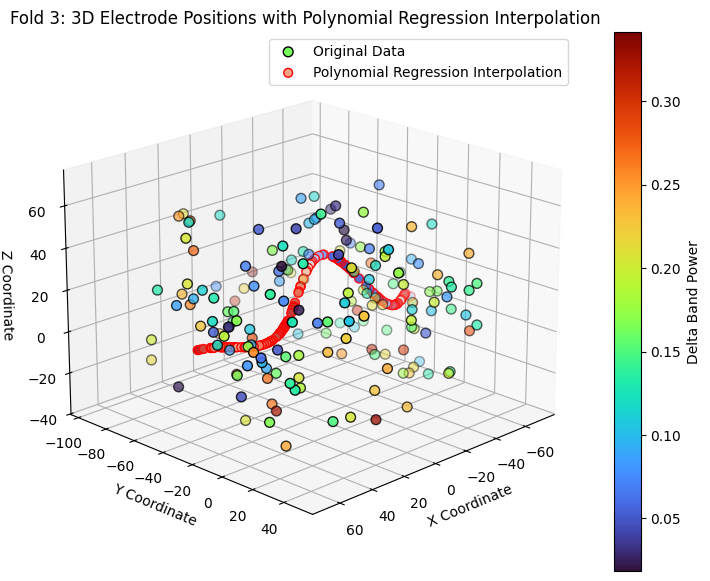


=== Fold 4 ===
MSE  : 0.0042
MAE  : 0.0542
RMSE : 0.0650
R²   : -0.0034
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


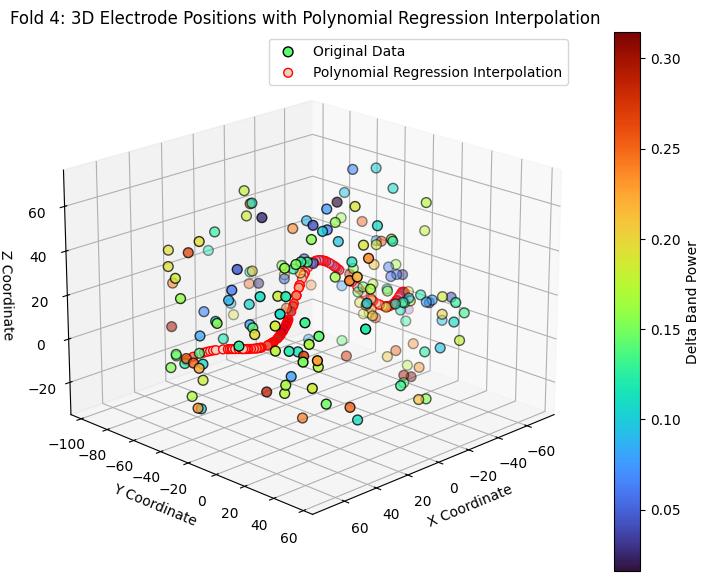


=== Fold 5 ===
MSE  : 0.0048
MAE  : 0.0566
RMSE : 0.0696
R²   : -0.0238
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


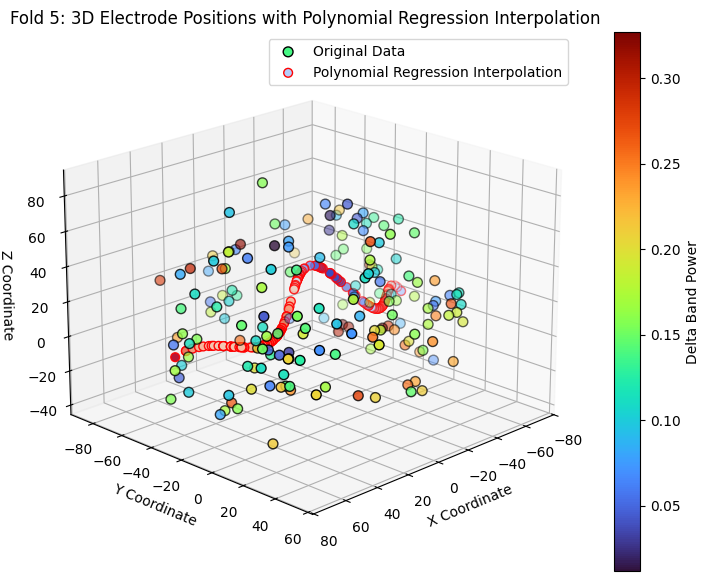


=== Fold 6 ===
MSE  : 0.0050
MAE  : 0.0593
RMSE : 0.0710
R²   : -0.0309
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


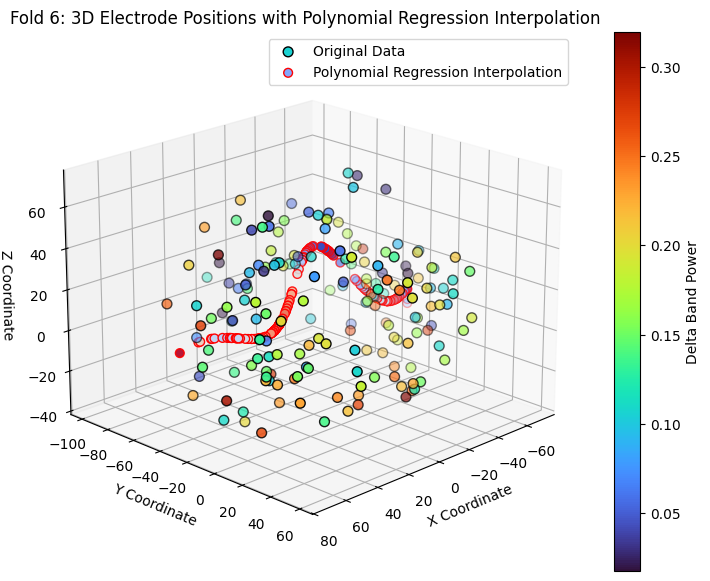


=== Fold 7 ===
MSE  : 0.0052
MAE  : 0.0586
RMSE : 0.0718
R²   : -0.0147
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


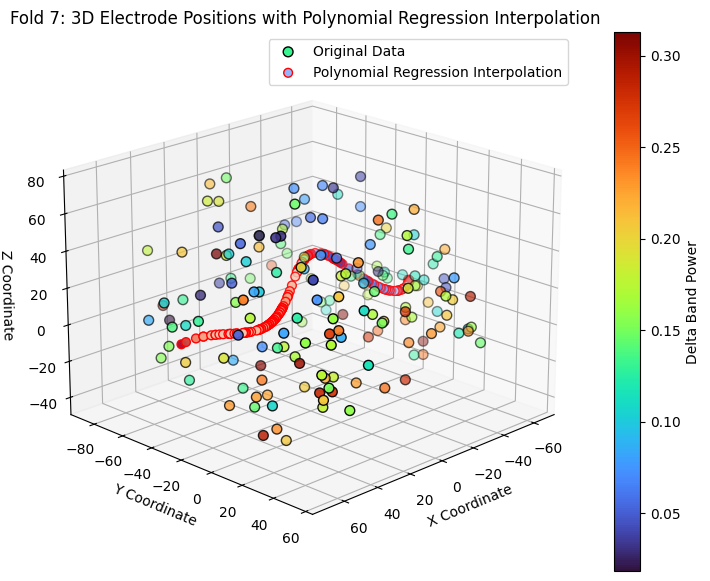


=== Fold 8 ===
MSE  : 0.0053
MAE  : 0.0602
RMSE : 0.0730
R²   : -0.0406
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


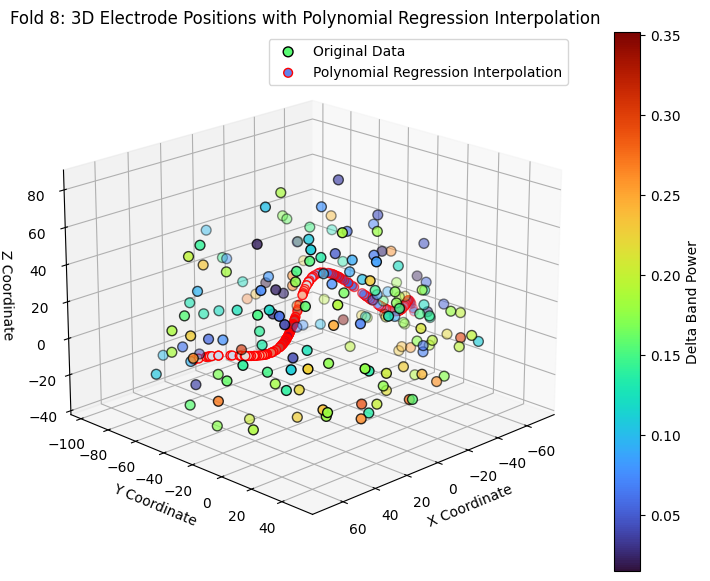


=== Fold 9 ===
MSE  : 0.0042
MAE  : 0.0533
RMSE : 0.0646
R²   : -0.0579
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


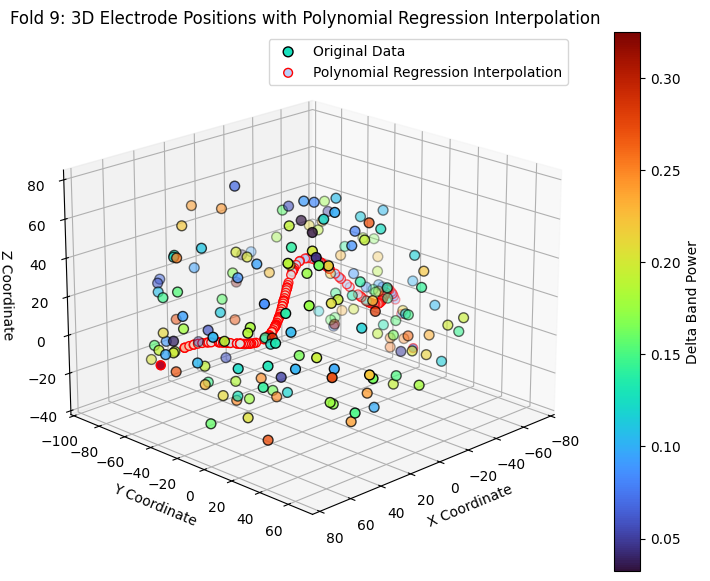


=== Fold 10 ===
MSE  : 0.0047
MAE  : 0.0571
RMSE : 0.0688
R²   : -0.0105
X_test shape: (177, 1), Y_test shape: (177,), Z_test shape: (177,)
Delta_interp shape: (177,)


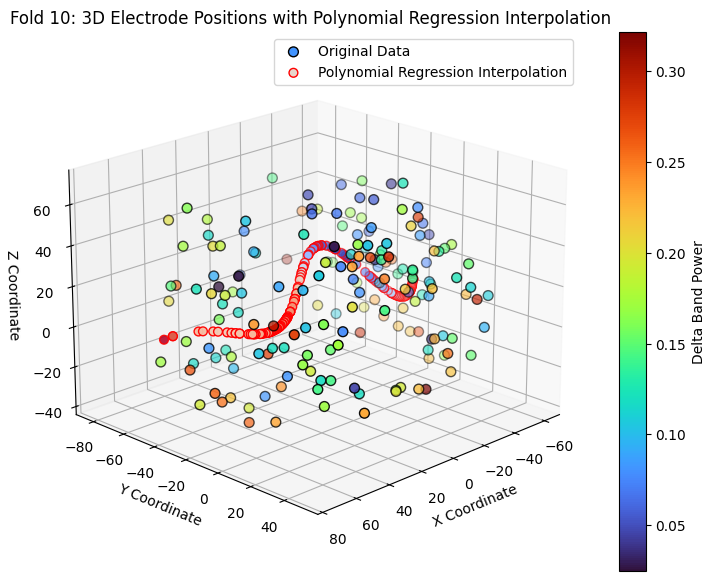


=== Final Evaluation Across 10 Folds ===
Mean MSE  : 0.0049 ± 0.0004
Mean MAE  : 0.0577 ± 0.0023
Mean RMSE : 0.0701 ± 0.0030
Mean R²   : -0.0282 ± 0.0226

T-test Results Across 10 Folds:
T-test between MSE and MAE: T-statistic = -83.4008, P-value = 0.0000
T-test between MSE and RMSE: T-statistic = -74.6341, P-value = 0.0000
T-test between MSE and R²: T-statistic = 4.4149, P-value = 0.0017
Significant difference found between MSE and MAE (p < 0.05).
Significant difference found between MSE and RMSE (p < 0.05).
Significant difference found between MSE and R² (p < 0.05).


In [21]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from scipy.stats import ttest_rel  # T-test for paired samples

# Load dataset
samples = np.load('coords.npy')  # 3D electrode coordinates
band_powers = np.load('band_powers.npy', allow_pickle=True).item()  # Frequency band power data

# Convert to NumPy arrays to avoid indexing issues
X = np.array(samples[:, 0]).reshape(-1, 1)
Y = np.array(samples[:, 1])
Z = np.array(samples[:, 2])
delta_powers = np.array(band_powers['Delta'])  # Ensure it's a NumPy array

# Define KFold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Function to compute evaluation metrics
def compute_metrics(true_values, predicted_values):
    """Compute evaluation metrics: MSE, MAE, RMSE, R²."""
    mse = mean_squared_error(true_values, predicted_values)
    mae = mean_absolute_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    r2 = r2_score(true_values, predicted_values)
    return mse, mae, rmse, r2

# Store evaluation metrics
mse_scores = []
mae_scores = []
rmse_scores = []
r2_scores = []

# Polynomial degree
degree = 6  # 可以调整阶数

# Perform 10-fold cross-validation
fold = 1
for train_index, test_index in kf.split(X):
    print(f"\n=== Fold {fold} ===")

    # Split data into training and testing sets
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]
    Z_train, Z_test = Z[train_index], Z[test_index]
    Delta_train, Delta_test = delta_powers[train_index], delta_powers[test_index]

    # Remove duplicate X values to ensure proper regression fitting
    unique_indices = np.unique(X_train, return_index=True)[1]
    X_train = X_train[unique_indices]
    Y_train = Y_train[unique_indices]
    Z_train = Z_train[unique_indices]
    Delta_train = Delta_train[unique_indices]

    # Transform features using polynomial basis
    poly = PolynomialFeatures(degree)
    X_poly_train = poly.fit_transform(X_train)

    # Train polynomial regression models
    model_y = LinearRegression().fit(X_poly_train, Y_train)
    model_z = LinearRegression().fit(X_poly_train, Z_train)
    model_delta = LinearRegression().fit(X_poly_train, Delta_train)

    # Transform test data
    X_poly_test = poly.transform(X_test)

    # Predict values
    Y_interp = model_y.predict(X_poly_test)
    Z_interp = model_z.predict(X_poly_test)
    Delta_interp = model_delta.predict(X_poly_test)

    # 修正 Delta_interp 的大小
    if len(Delta_interp) != len(X_test):
        print(f"Warning: Mismatched dimensions - X_test: {len(X_test)}, Delta_interp: {len(Delta_interp)}")
        Delta_interp = np.interp(X_test.flatten(), X_test.flatten(), Delta_interp.flatten())

    # 强制转换 Delta_interp 为 float64
    Delta_interp = np.array(Delta_interp, dtype=np.float64)

    # Compute metrics for this fold
    mse, mae, rmse, r2 = compute_metrics(Delta_test, Delta_interp)

    # Store scores
    mse_scores.append(mse)
    mae_scores.append(mae)
    rmse_scores.append(rmse)
    r2_scores.append(r2)

    # Print evaluation metrics
    print(f"MSE  : {mse:.4f}")
    print(f"MAE  : {mae:.4f}")
    print(f"RMSE : {rmse:.4f}")
    print(f"R²   : {r2:.4f}")

    # 📌 3D 可视化插值结果
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Debugging print
    print(f"X_test shape: {X_test.shape}, Y_test shape: {Y_test.shape}, Z_test shape: {Z_test.shape}")
    print(f"Delta_interp shape: {Delta_interp.shape}")

    # 原始测试数据点
    sc = ax.scatter(X_test.flatten(), Y_test, Z_test, c=Delta_test, cmap='turbo', label="Original Data", s=50, edgecolor='k')

    # 插值后的数据点
    sc_interp = ax.scatter(X_test.flatten(), Y_interp, Z_interp, c=Delta_interp, cmap='coolwarm', label="Polynomial Regression Interpolation", s=40, edgecolor='r')

    # Color bar
    cbar = plt.colorbar(sc)
    cbar.set_label('Delta Band Power')

    # 坐标轴标签
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.set_zlabel('Z Coordinate')
    ax.set_title(f'Fold {fold}: 3D Electrode Positions with Polynomial Regression Interpolation')

    # 显示图例
    ax.legend()

    # 视角调整
    ax.view_init(elev=20, azim=45)

    # 📌 确保 Matplotlib 正常显示
    plt.show()

    fold += 1

# Perform t-test to compare MSE and MAE scores across folds
t_stat_mse, p_value_mse = ttest_rel(mse_scores, mae_scores)  # T-test between MSE and MAE
t_stat_rmse, p_value_rmse = ttest_rel(mse_scores, rmse_scores)  # T-test between MSE and RMSE
t_stat_r2, p_value_r2 = ttest_rel(mse_scores, r2_scores)  # T-test between MSE and R²

# Print final evaluation
print("\n=== Final Evaluation Across 10 Folds ===")
print(f"Mean MSE  : {np.mean(mse_scores):.4f} ± {np.std(mse_scores):.4f}")
print(f"Mean MAE  : {np.mean(mae_scores):.4f} ± {np.std(mae_scores):.4f}")
print(f"Mean RMSE : {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")
print(f"Mean R²   : {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")

# Print t-test results
print("\nT-test Results Across 10 Folds:")
print(f"T-test between MSE and MAE: T-statistic = {t_stat_mse:.4f}, P-value = {p_value_mse:.4f}")
print(f"T-test between MSE and RMSE: T-statistic = {t_stat_rmse:.4f}, P-value = {p_value_rmse:.4f}")
print(f"T-test between MSE and R²: T-statistic = {t_stat_r2:.4f}, P-value = {p_value_r2:.4f}")

# Interpretation of t-test
def interpret_t_test(p_value, metric1, metric2):
    if p_value < 0.05:
        print(f"Significant difference found between {metric1} and {metric2} (p < 0.05).")
    else:
        print(f"No significant difference found between {metric1} and {metric2} (p >= 0.05).")

interpret_t_test(p_value_mse, "MSE", "MAE")
interpret_t_test(p_value_rmse, "MSE", "RMSE")
interpret_t_test(p_value_r2, "MSE", "R²")



=== Fold 1 ===
MSE  : 0.0135
MAE  : 0.0885
RMSE : 0.1160
R²   : -1.8728


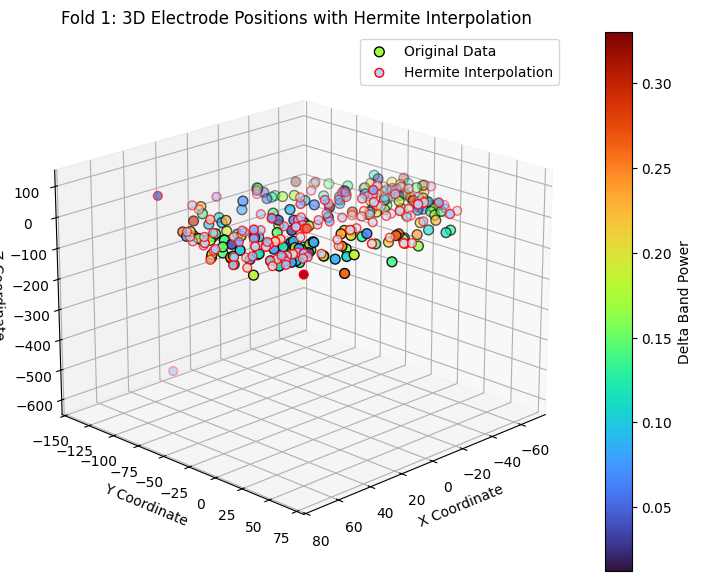


=== Fold 2 ===
MSE  : 0.0164
MAE  : 0.0854
RMSE : 0.1279
R²   : -2.0729


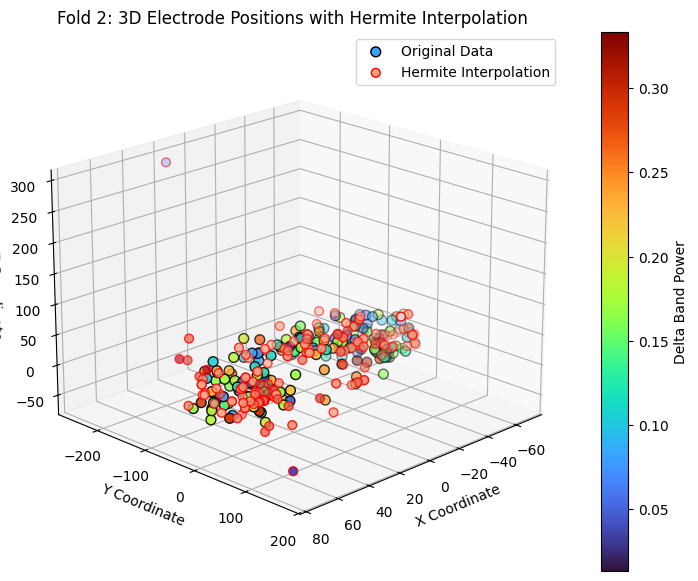


=== Fold 3 ===
MSE  : 0.0127
MAE  : 0.0843
RMSE : 0.1127
R²   : -1.3908


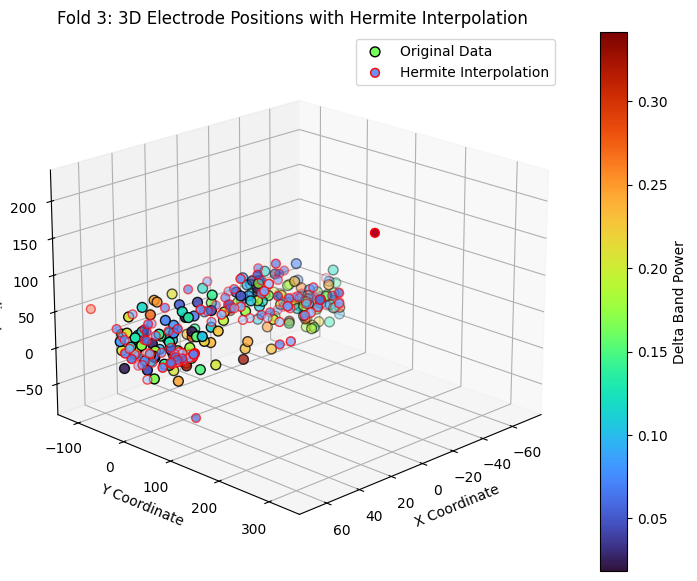


=== Fold 4 ===
MSE  : 0.0125
MAE  : 0.0786
RMSE : 0.1116
R²   : -1.9600


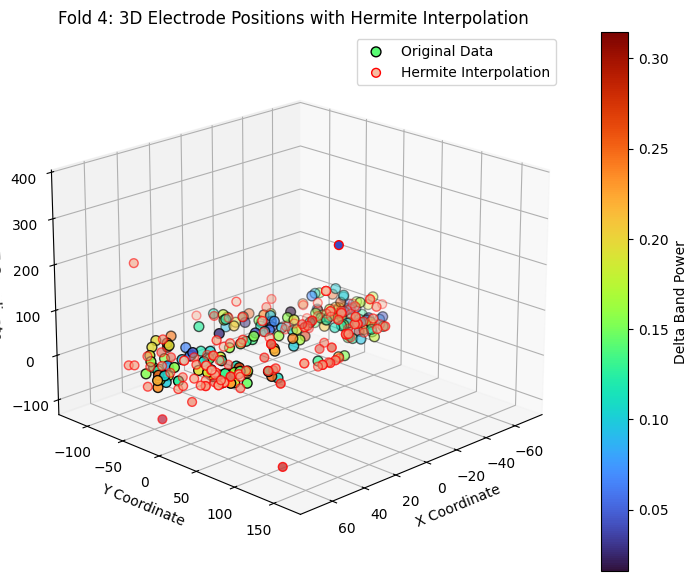


=== Fold 5 ===
MSE  : 0.0081
MAE  : 0.0694
RMSE : 0.0901
R²   : -0.7155


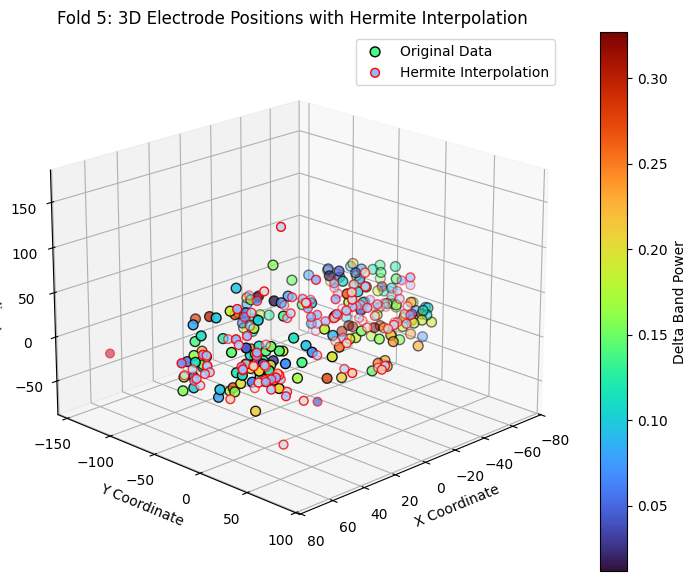


=== Fold 6 ===
MSE  : 0.0098
MAE  : 0.0791
RMSE : 0.0992
R²   : -1.0131


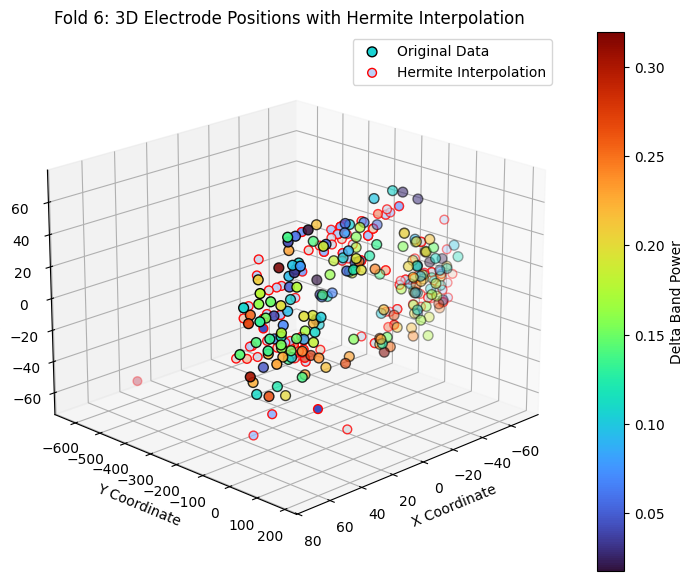


=== Fold 7 ===
MSE  : 0.0101
MAE  : 0.0778
RMSE : 0.1003
R²   : -0.9789


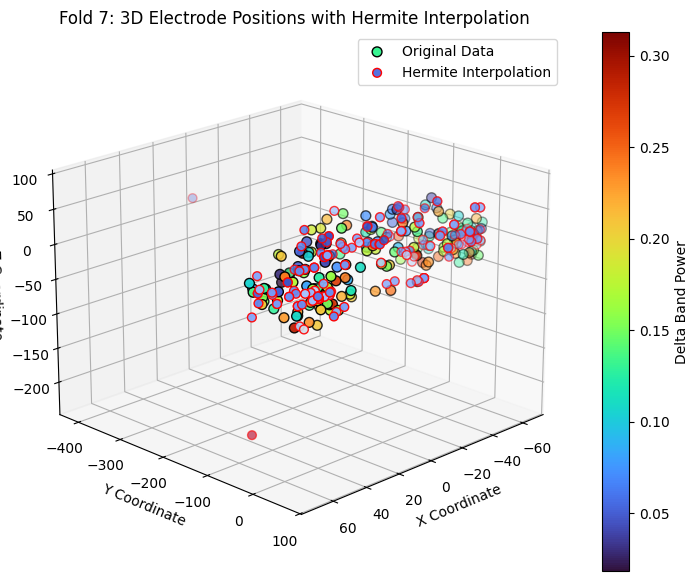


=== Fold 8 ===
MSE  : 877260269758843392.0000
MAE  : 70400800.5844
RMSE : 936621732.4827
R²   : -171385750928103768064.0000


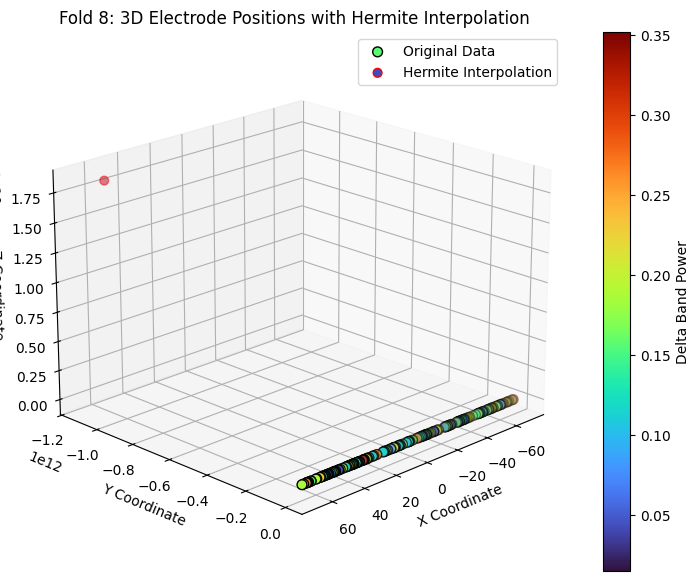


=== Fold 9 ===
MSE  : 0.0092
MAE  : 0.0760
RMSE : 0.0959
R²   : -1.3285


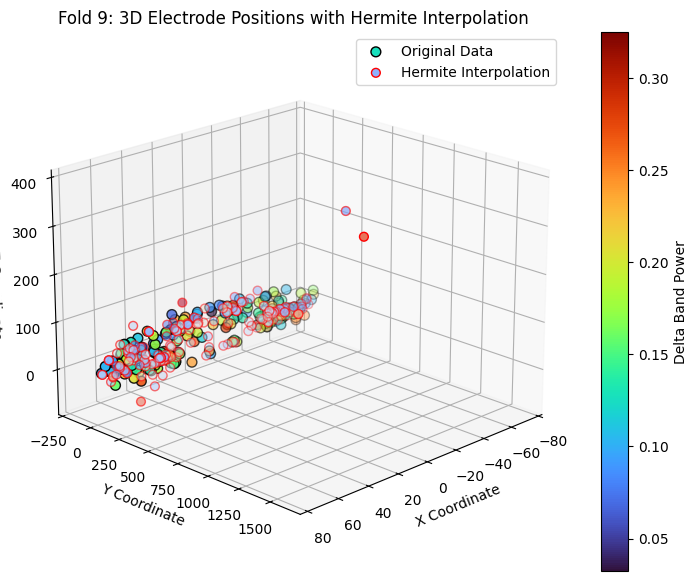


=== Fold 10 ===
MSE  : 0.0072
MAE  : 0.0693
RMSE : 0.0847
R²   : -0.5336


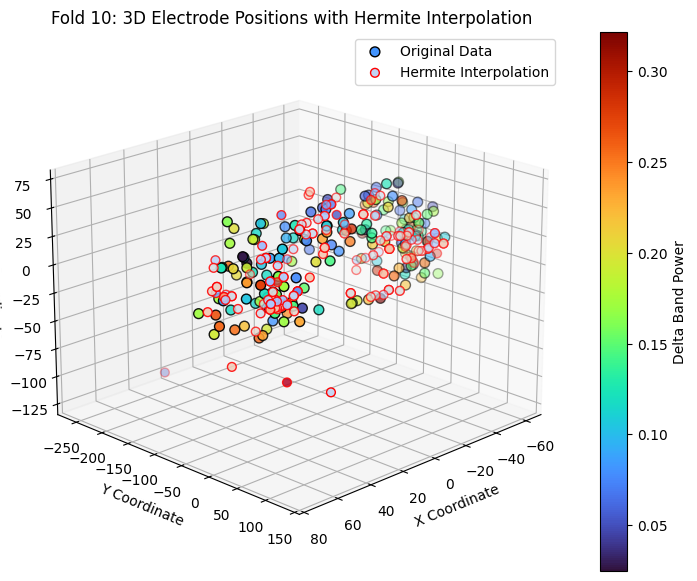


=== Final Evaluation Across 10 Folds ===
Mean MSE  : 87726026975884336.0000 ± 263178080927653024.0000
Mean MAE  : 7040080.1293 ± 21120240.1517
Mean RMSE : 93662173.3421 ± 280986519.7135
Mean R²   : -17138575092810377216.0000 ± 51415725278431133696.0000


In [22]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import CubicHermiteSpline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from scipy.stats import ttest_rel  # T-test for paired samples

# Load dataset
samples = np.load('coords.npy')  # 3D electrode coordinates
band_powers = np.load('band_powers.npy', allow_pickle=True).item()  # Frequency band power data

# Convert to NumPy arrays to avoid indexing issues
X = np.array(samples[:, 0])
Y = np.array(samples[:, 1])
Z = np.array(samples[:, 2])
delta_powers = np.array(band_powers['Delta'])  # Ensure it's a NumPy array

# Define KFold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Function to compute evaluation metrics
def compute_metrics(true_values, predicted_values):
    """Compute evaluation metrics: MSE, MAE, RMSE, R²."""
    mse = mean_squared_error(true_values, predicted_values)
    mae = mean_absolute_error(true_values, predicted_values)
    rmse = np.sqrt(mse)
    r2 = r2_score(true_values, predicted_values)
    return mse, mae, rmse, r2

# Store evaluation metrics
mse_scores = []
mae_scores = []
rmse_scores = []
r2_scores = []

# Compute numerical derivatives for Hermite interpolation
def compute_derivative(X, Y):
    """Compute first-order numerical derivatives using central differences."""
    dY = np.gradient(Y, X)
    return dY

# Perform 10-fold cross-validation
fold = 1
for train_index, test_index in kf.split(X):
    print(f"\n=== Fold {fold} ===")

    # Split data into training and testing sets
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]
    Z_train, Z_test = Z[train_index], Z[test_index]
    Delta_train, Delta_test = delta_powers[train_index], delta_powers[test_index]

    # Remove duplicate X values to ensure proper interpolation
    unique_indices = np.unique(X_train, return_index=True)[1]
    X_train = X_train[unique_indices]
    Y_train = Y_train[unique_indices]
    Z_train = Z_train[unique_indices]
    Delta_train = Delta_train[unique_indices]

    # Compute first derivatives for Hermite interpolation
    dY_train = compute_derivative(X_train, Y_train)
    dZ_train = compute_derivative(X_train, Z_train)
    dDelta_train = compute_derivative(X_train, Delta_train)

    # Fit Hermite interpolators
    interp_y = CubicHermiteSpline(X_train, Y_train, dY_train)
    interp_z = CubicHermiteSpline(X_train, Z_train, dZ_train)
    interp_delta = CubicHermiteSpline(X_train, Delta_train, dDelta_train)

    # Interpolate values for test X positions
    Y_interp = interp_y(X_test)
    Z_interp = interp_z(X_test)
    Delta_interp = interp_delta(X_test)

    # Compute metrics for this fold
    mse, mae, rmse, r2 = compute_metrics(Delta_test, Delta_interp)

    # Store scores
    mse_scores.append(mse)
    mae_scores.append(mae)
    rmse_scores.append(rmse)
    r2_scores.append(r2)

    # Print evaluation metrics
    print(f"MSE  : {mse:.4f}")
    print(f"MAE  : {mae:.4f}")
    print(f"RMSE : {rmse:.4f}")
    print(f"R²   : {r2:.4f}")

    # 📌 3D 可视化插值结果
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # 原始测试数据点
    sc = ax.scatter(X_test, Y_test, Z_test, c=Delta_test, cmap='turbo', label="Original Data", s=50, edgecolor='k')

    # 插值后的数据点
    sc_interp = ax.scatter(X_test, Y_interp, Z_interp, c=Delta_interp, cmap='coolwarm', label="Hermite Interpolation", s=40, edgecolor='r')

    # Color bar
    cbar = plt.colorbar(sc)
    cbar.set_label('Delta Band Power')

    # 坐标轴标签
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.set_zlabel('Z Coordinate')
    ax.set_title(f'Fold {fold}: 3D Electrode Positions with Hermite Interpolation')

    # 显示图例
    ax.legend()

    # 视角调整
    ax.view_init(elev=20, azim=45)

    # 📌 确保 Matplotlib 正常显示
    plt.show()

    fold += 1

# Perform t-test to compare MSE and MAE scores across folds
t_stat_mse, p_value_mse = ttest_rel(mse_scores, mae_scores)  # T-test between MSE and MAE
t_stat_rmse, p_value_rmse = ttest_rel(mse_scores, rmse_scores)  # T-test between MSE and RMSE
t_stat_r2, p_value_r2 = ttest_rel(mse_scores, r2_scores)  # T-test between MSE and R²

# Print final evaluation
print("\n=== Final Evaluation Across 10 Folds ===")
print(f"Mean MSE  : {np.mean(mse_scores):.4f} ± {np.std(mse_scores):.4f}")
print(f"Mean MAE  : {np.mean(mae_scores):.4f} ± {np.std(mae_scores):.4f}")
print(f"Mean RMSE : {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")
print(f"Mean R²   : {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")
